# Virat Kohli Centuries Analysis

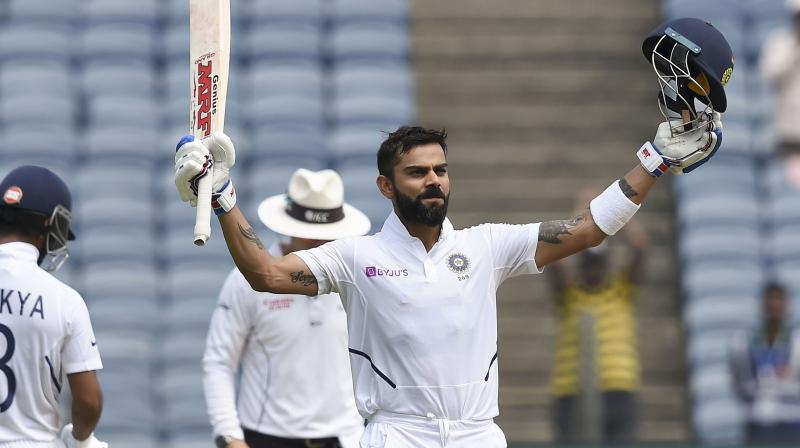

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go 

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("virat_centuries.csv")

In [4]:
df.head()

,Score,Out/Not Out,Against,Batting Order,Inn.,Strike Rate,Venue,Column1,H/A,Date,Result,Format,Man of the Match,Captain
0,116,Out,Australia,6,2,NaN,Adelaide Oval,Adelaide,Away,24-01-2012,Lost,Test,No,No
1,103,Out,New Zealand,5,2,NaN,M. Chinnaswamy Stadium,Bangalore,Home,31-08-2012,Won,Test,Yes,No
2,103,Out,England,5,2,NaN,Vidarbha Cricket Association Stadium,Nagpur,Home,13-12-2012,Drawn,Test,No,No
3,107,Out,Australia,5,2,NaN,M. A. Chidambaram Stadium,Chennai,Home,22-02-2013,Won,Test,No,No
4,119,Out,South Africa,4,1,NaN,Wanderers Stadium,Johannesburg,Away,18-12-2013,Drawn,Test,No,No


In [5]:
df.tail()

,Score,Out/Not Out,Against,Batting Order,Inn.,Strike Rate,Venue,Column1,H/A,Date,Result,Format,Man of the Match,Captain
71,113,Out,Bangladesh,3,1,124.80,Zohur Ahmed Chaudhary,Chittagong,Away,10-12-2022,Won,ODI,No,No
72,113,Out,Sri Lanka,3,1,129.89,Barsapara,Guwahati,Home,10-01-2023,Won,ODI,Yes,No
73,166,Not Out,Sri Lanka,3,1,150.91,Green field,Thiruvanantpuram,Home,15-01-2023,Won,ODI,Yes,No
74,186,Out,Australia,4,1,51.09,Motera,Ahemdabad,Home,12-03-2023,Drawn,Test,Yes,No
75,121,Out,West Indies,4,1,58.74,Queen's Park Oval,Port of Spain,Away,21-07-2023,Drawn,Test,No,No


In [6]:
df.shape

(76, 14)

In [7]:
df.columns

Index(['Score', 'Out/Not Out', 'Against', 'Batting Order', 'Inn.',
       'Strike Rate', 'Venue', 'Column1', 'H/A', 'Date', 'Result', 'Format',
       'Man of the Match', 'Captain'],
      dtype='object')

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

Score                0
Out/Not Out          0
Against              0
Batting Order        0
Inn.                 0
Strike Rate         27
Venue                0
Column1              0
H/A                  0
Date                 0
Result               0
Format               0
Man of the Match     0
Captain              0
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Score             76 non-null     int64  
 1   Out/Not Out       76 non-null     object 
 2   Against           76 non-null     object 
 3   Batting Order     76 non-null     int64  
 4   Inn.              76 non-null     int64  
 5   Strike Rate       49 non-null     float64
 6   Venue             76 non-null     object 
 7   Column1           76 non-null     object 
 8   H/A               76 non-null     object 
 9   Date              76 non-null     object 
 10  Result            76 non-null     object 
 11  Format            76 non-null     object 
 12  Man of the Match  76 non-null     object 
 13  Captain           76 non-null     object 
dtypes: float64(1), int64(3), object(10)
memory usage: 8.4+ KB


In [11]:
mean_strike_rate = df['Strike Rate'].mean()
df['Strike Rate'].fillna(mean_strike_rate, inplace=True)

In [12]:
df.describe()

,Score,Batting Order,Inn.,Strike Rate
count,76.000000,76.000000,76.000000,76.000000
mean,132.644737,3.513158,1.684211,112.903878
std,35.619734,0.702252,0.677457,21.944045
min,100.000000,1.000000,1.000000,51.090000
25%,107.000000,3.000000,1.000000,100.875000
50%,119.500000,3.000000,2.000000,112.903878
75%,140.250000,4.000000,2.000000,114.952500
max,254.000000,6.000000,4.000000,200.000000


In [13]:
new_column_names = {
    'Score': 'Batting Score',
    'Out/Not Out': 'Batting Status',
    'Against': 'Opponent Team',
    'Batting Order': 'Batting Position',
    'Inn.': 'Inning Number',
    'Strike Rate': 'Batting Strike Rate',
    'Venue': 'Match Venue',
    'Column1': 'City',  
    'H/A': 'Home/Away',
    'Date': 'Match Date',
    'Result': 'Match Result',
    'Format': 'Match Format',
    'Man of the Match': 'Player of the Match',
    'Captain': 'Team Captain'
}

In [14]:
df.rename(columns=new_column_names, inplace=True)

In [15]:
df.nunique()

Batting Score          50
Batting Status          2
Opponent Team          10
Batting Position        5
Inning Number           4
Batting Strike Rate    50
Match Venue            49
City                   47
Home/Away               2
Match Date             75
Match Result            6
Match Format            3
Player of the Match     2
Team Captain            2
dtype: int64

In [16]:
column_data_types = df.dtypes

In [17]:
categorical_columns = column_data_types[column_data_types == 'object'].index.tolist()
numerical_columns = column_data_types[column_data_types != 'object'].index.tolist()

print("Categorical Columns:", categorical_columns)
print()
print("Numerical Columns:", numerical_columns)

Categorical Columns: ['Batting Status', 'Opponent Team', 'Match Venue', 'City', 'Home/Away', 'Match Date', 'Match Result', 'Match Format', 'Player of the Match', 'Team Captain']

Numerical Columns: ['Batting Score', 'Batting Position', 'Inning Number', 'Batting Strike Rate']


In [18]:
for i in categorical_columns:
    print(i, '- unique values are:')
    print(df[i].unique())
    print()

Batting Status - unique values are:
['Out' 'Not Out']

Opponent Team - unique values are:
['Australia' 'New Zealand' 'England' 'South Africa' 'Sri Lanka'
 'West Indies' 'Bangladesh' 'Pakistan' 'Zimbabwe' 'Afganistan']

Match Venue - unique values are:
['Adelaide Oval' 'M. Chinnaswamy Stadium'
 'Vidarbha Cricket Association Stadium' 'M. A. Chidambaram Stadium'
 'Wanderers Stadium' 'Basin Reserve' 'Melbourne Cricket Ground'
 'Sydney Cricket Ground' 'Galle International Stadium'
 'Sir Vivian Richards Stadium' 'Holkar Stadium' 'ACA-VDCA Cricket Stadium'
 'Wankhede Stadium' 'Rajiv Gandhi International Cricket Stadium'
 'Eden Gardens' 'Feroz Shah Kotla Ground' 'SuperSport Park'
 'Edgbaston Cricket Ground' 'Trent Bridge'
 'Saurashtra Cricket Association Stadium' 'Perth Stadium'
 'Maharashtra Cricket Association Stadium' 'Sher-e-Bangla Cricket Stadium'
 'APCA-VDCA Stadium' 'Nehru Stadium' 'Sophia Gardens' 'Bellerive Oval'
 'MRIC Stadium' 'R. Premadasa Stadium' "Queen's Park Oval"
 'Harare Spor

In [19]:
for i in categorical_columns:
    print(i, '- value counts are:')
    print(df[i].value_counts())
    print()

Batting Status - value counts are:
Out        55
Not Out    21
Name: Batting Status, dtype: int64

Opponent Team - value counts are:
Australia       16
Sri Lanka       15
West Indies     12
New Zealand      8
England          8
South Africa     7
Bangladesh       6
Pakistan         2
Zimbabwe         1
Afganistan       1
Name: Opponent Team, dtype: int64

Match Venue - value counts are:
Adelaide Oval                                   5
Queen's Park Oval                               4
Sher-e-Bangla Cricket Stadium                   4
Vidarbha Cricket Association Stadium            3
R. Premadasa Stadium                            3
Maharashtra Cricket Association Stadium         3
Eden Gardens                                    3
Wankhede Stadium                                2
JSCA International Stadium                      2
APCA-VDCA Stadium                               2
SuperSport Park                                 2
Feroz Shah Kotla Ground                         2
ACA-VDCA C

Batting Status - Countplot:


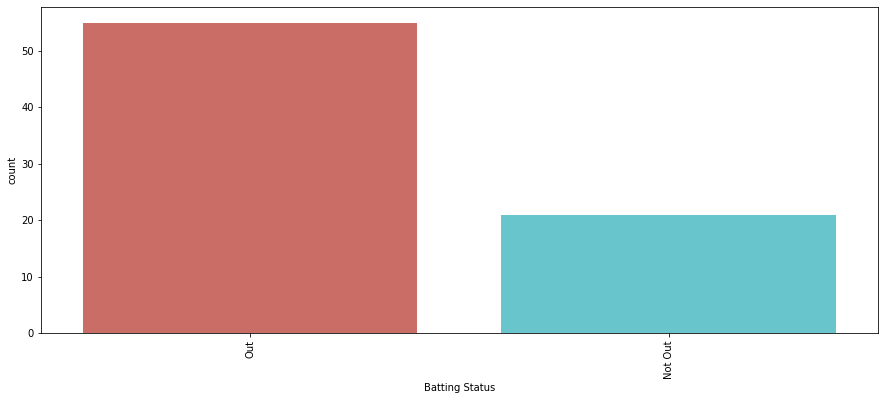

Opponent Team - Countplot:


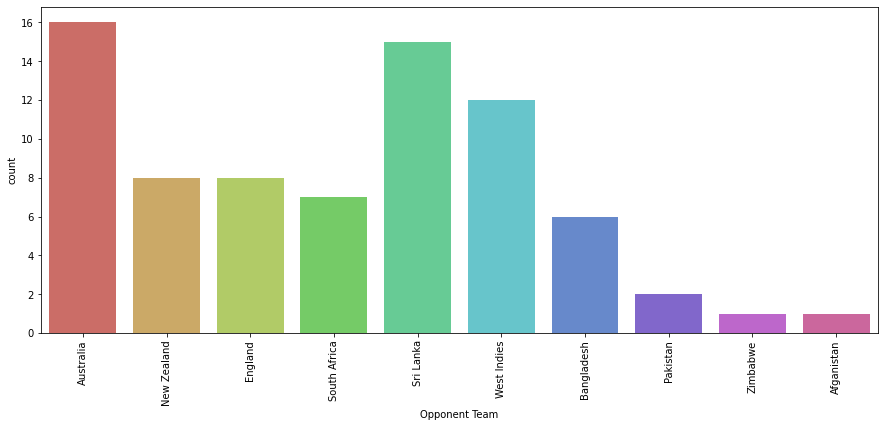

Match Venue - Countplot:


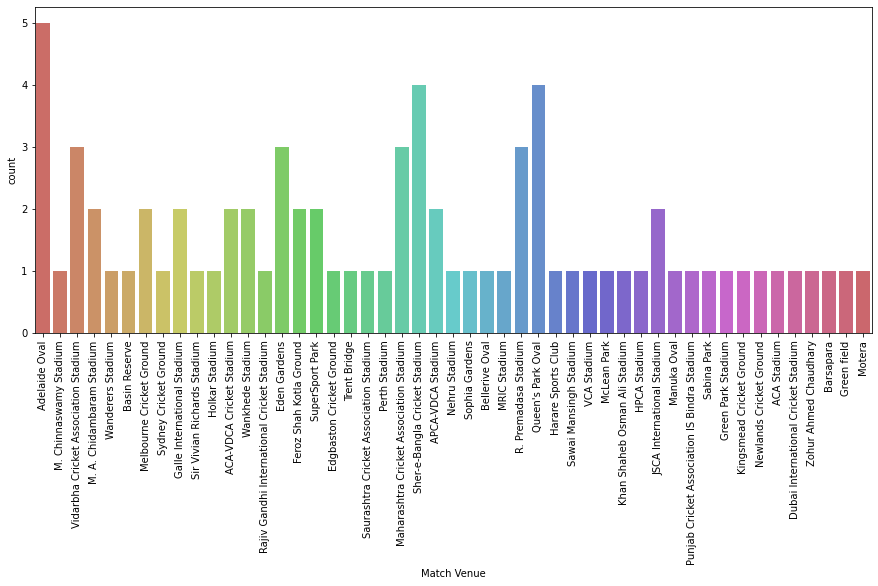

City - Countplot:


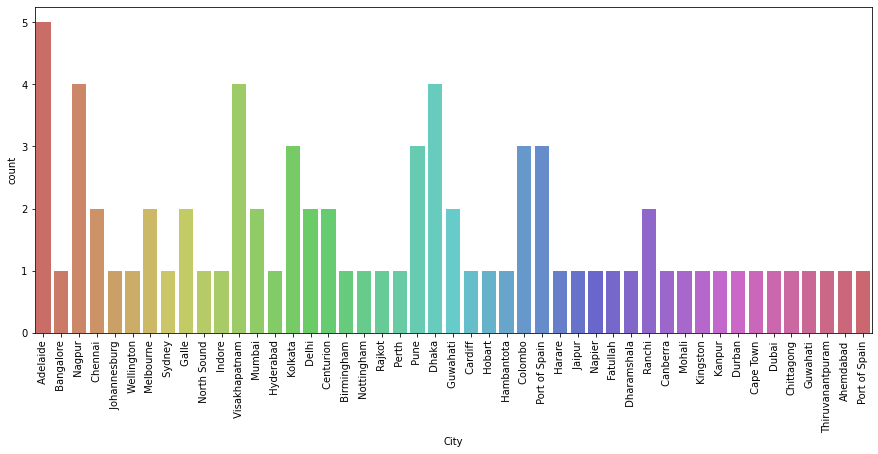

Home/Away - Countplot:


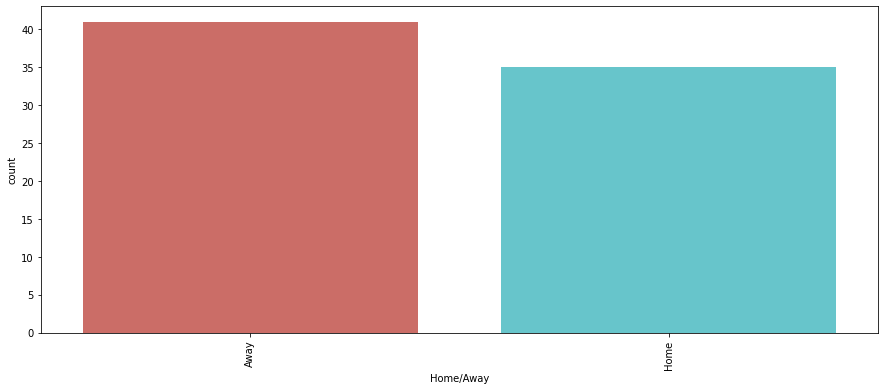

Match Result - Countplot:


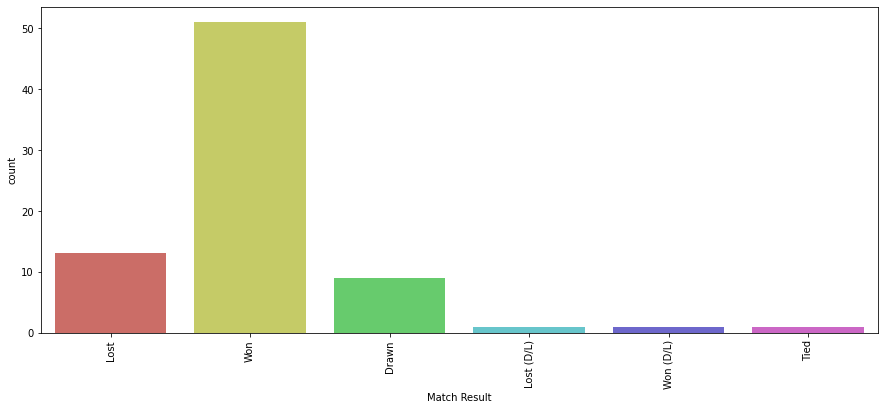

Match Format - Countplot:


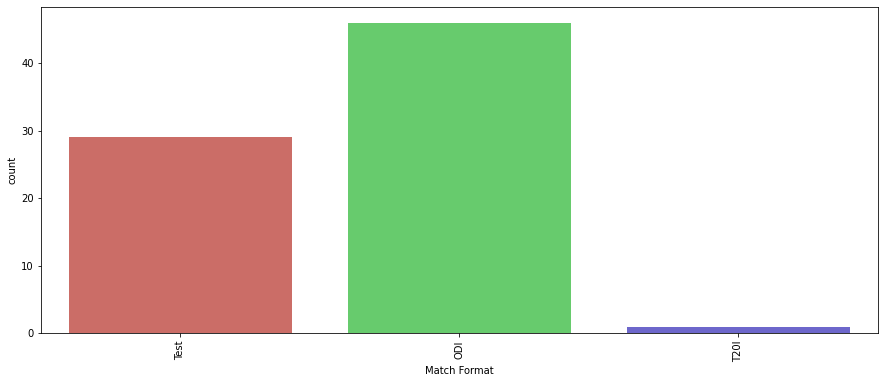

Player of the Match - Countplot:


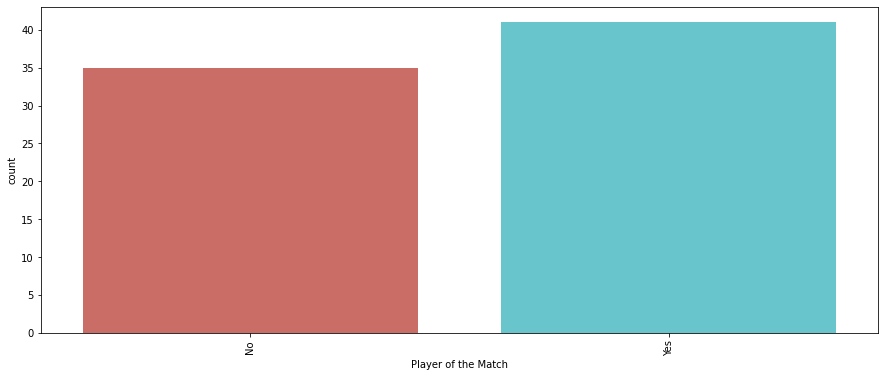

Team Captain - Countplot:


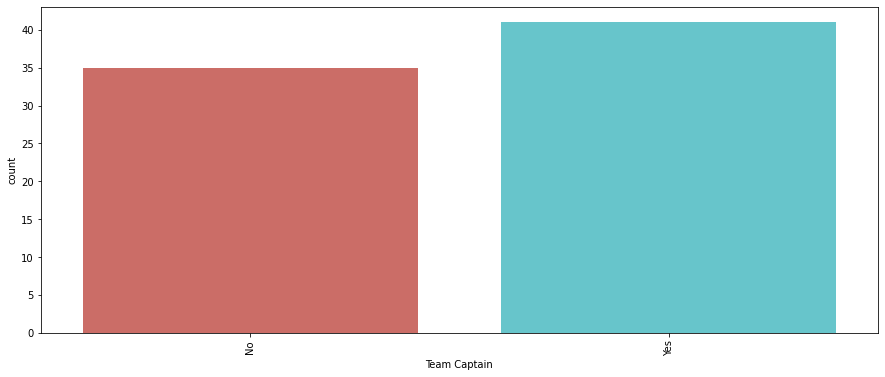

In [20]:
for i in categorical_columns:
    if i != 'Match Date':
        print(i, '- Countplot:')
        plt.figure(figsize=(15,6))
        sns.countplot(df[i], data = df, palette = 'hls')
        plt.xticks(rotation = 90)
        plt.show()

Batting Status - Pieplot:


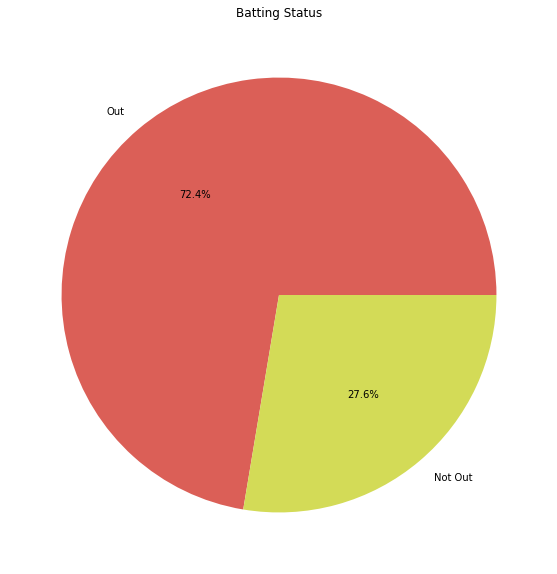

Opponent Team - Pieplot:


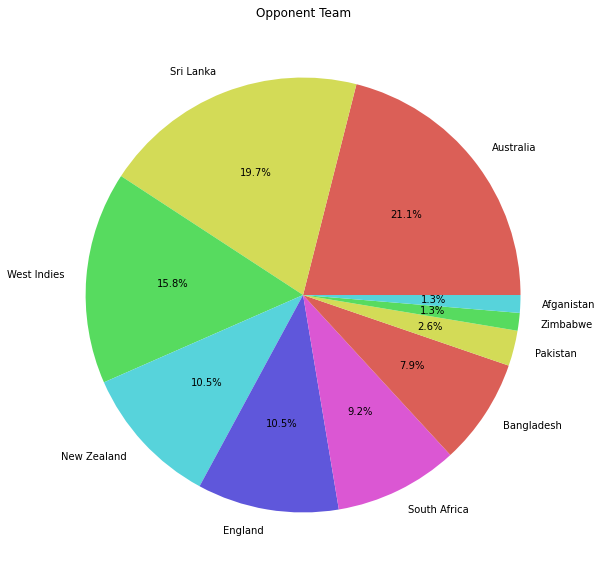

Match Venue - Pieplot:


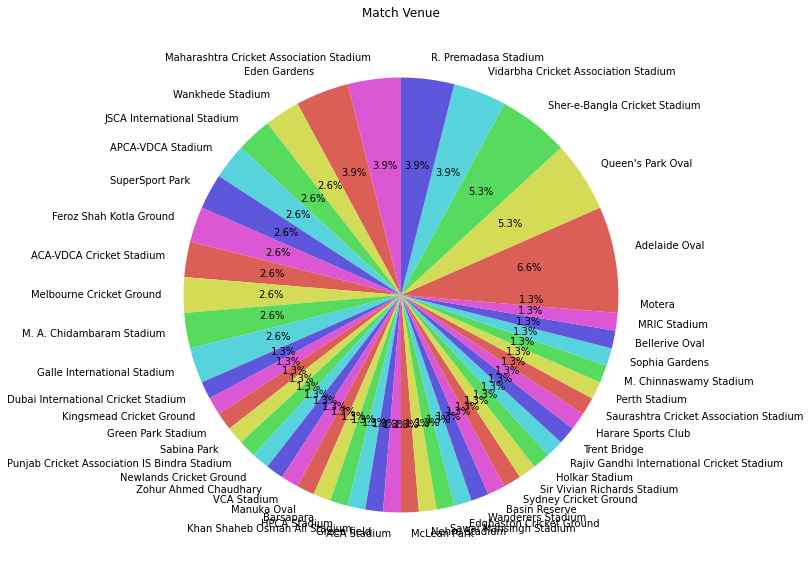

City - Pieplot:


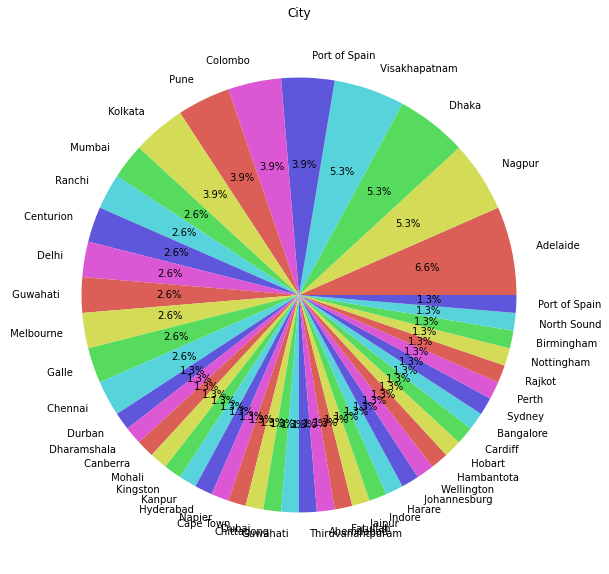

Home/Away - Pieplot:


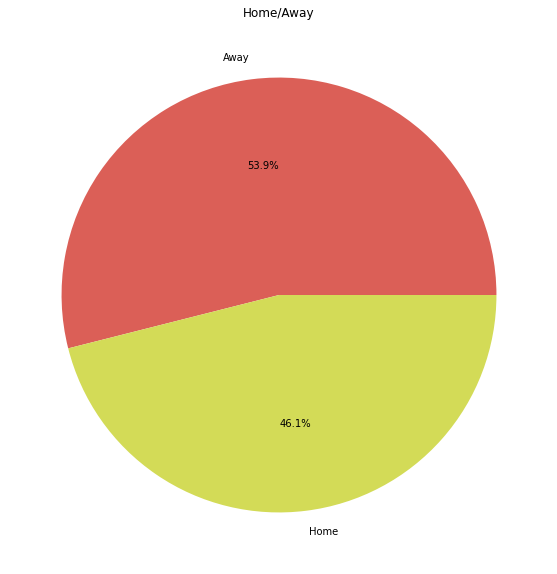

Match Result - Pieplot:


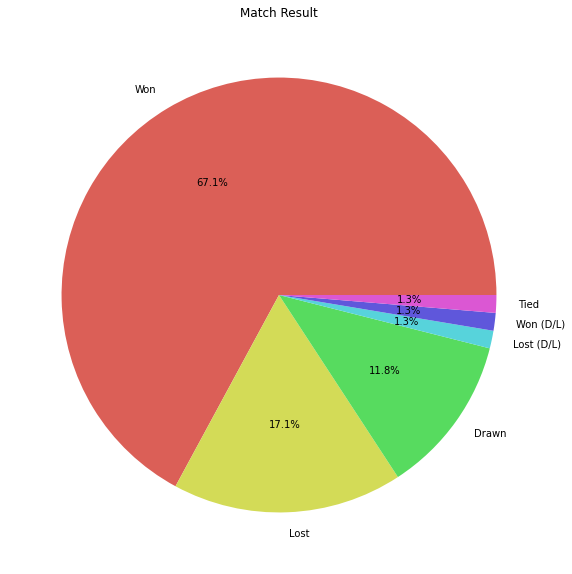

Match Format - Pieplot:


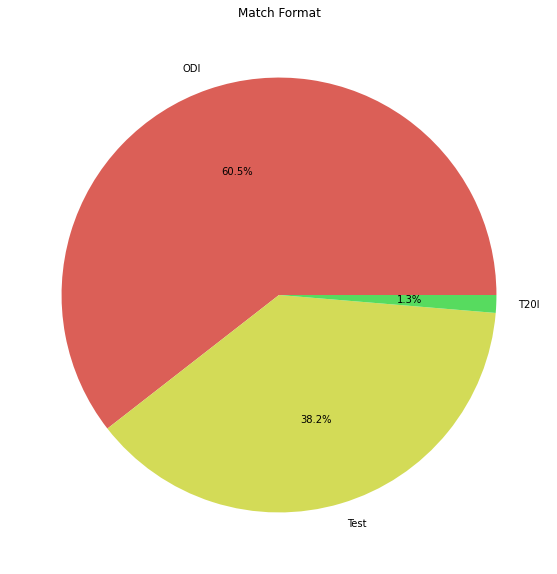

Player of the Match - Pieplot:


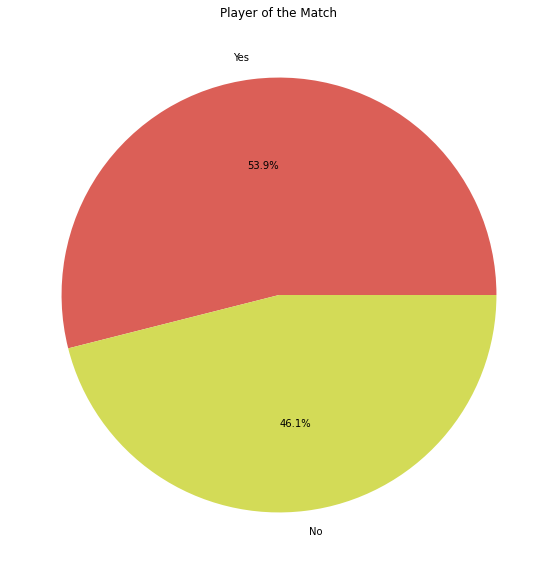

Team Captain - Pieplot:


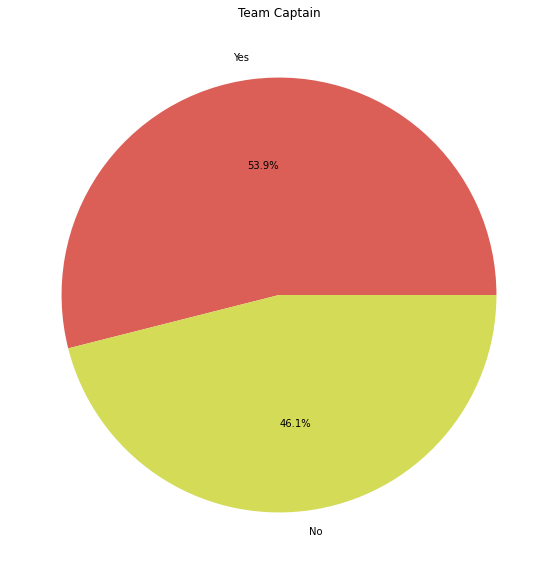

In [21]:
for i in categorical_columns:
    if i != 'Match Date':
        print(i, '- Pieplot:')
        plt.figure(figsize=(10, 10))
        counts = df[i].value_counts()
        plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
        plt.title(i)
        plt.show()

In [22]:
for i in categorical_columns:
    if i != 'Match Date':
        fig = go.Figure(data=[go.Bar(x=df[i].value_counts().index, y=df[i].value_counts())])
        fig.update_layout(title=i,xaxis_title="Categories",yaxis_title="Count")
        fig.show()

In [23]:
for i in categorical_columns:
    if i != 'Match Date':
        counts = df[i].value_counts()
        fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
        fig.update_layout(title=i)
        fig.show()

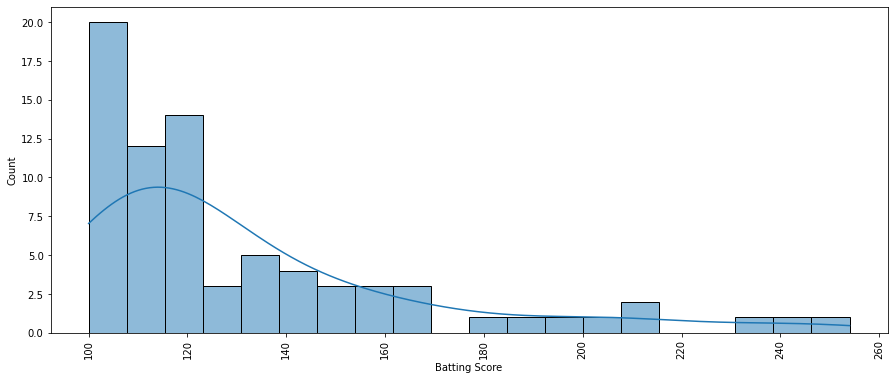

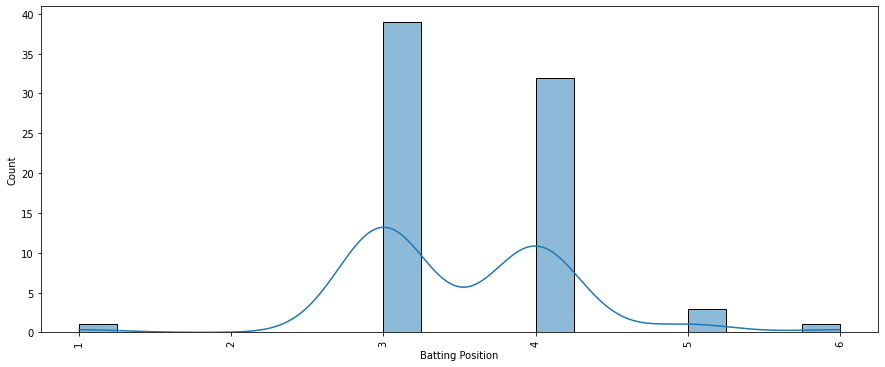

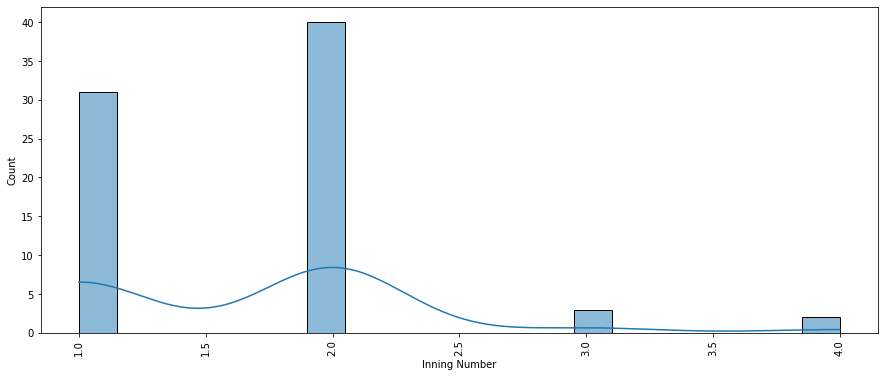

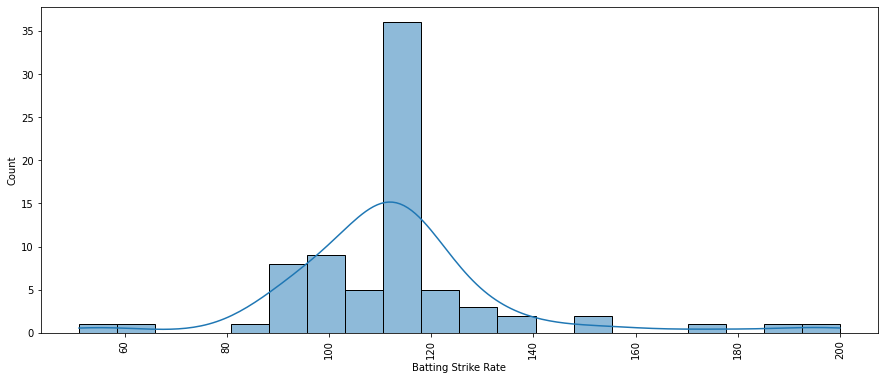

In [24]:
for i in numerical_columns:
    plt.figure(figsize=(15, 6))
    sns.histplot(df[i], kde=True, bins=20, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

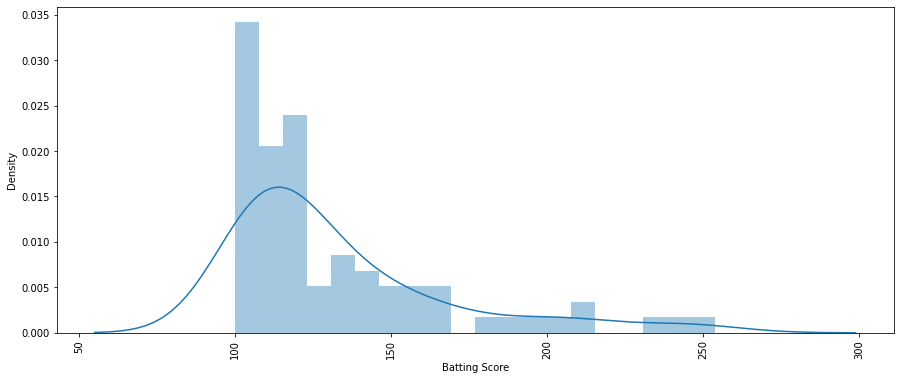

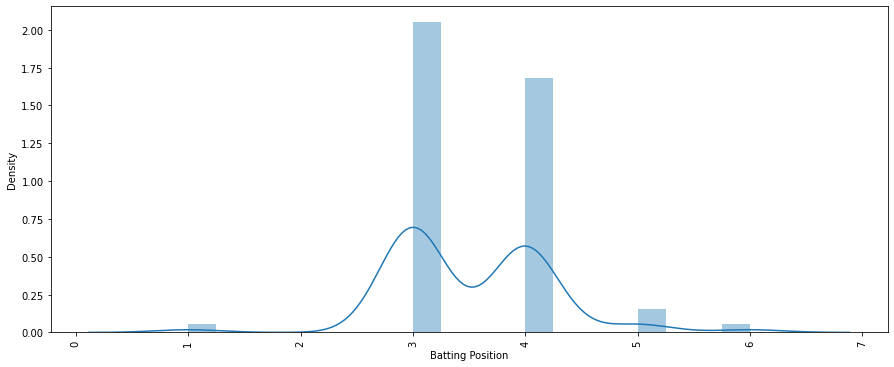

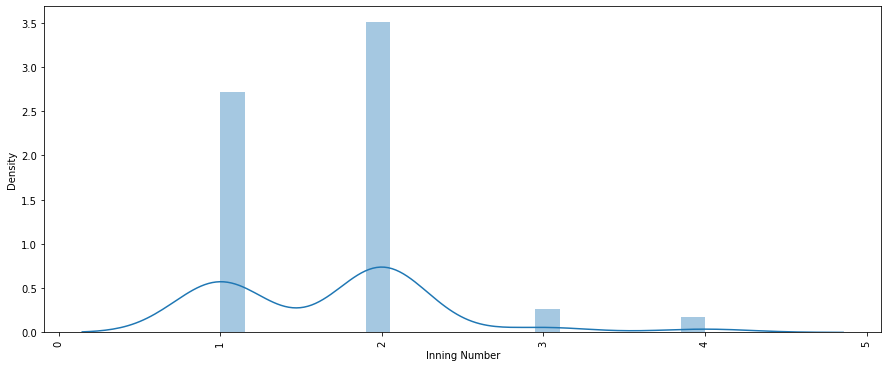

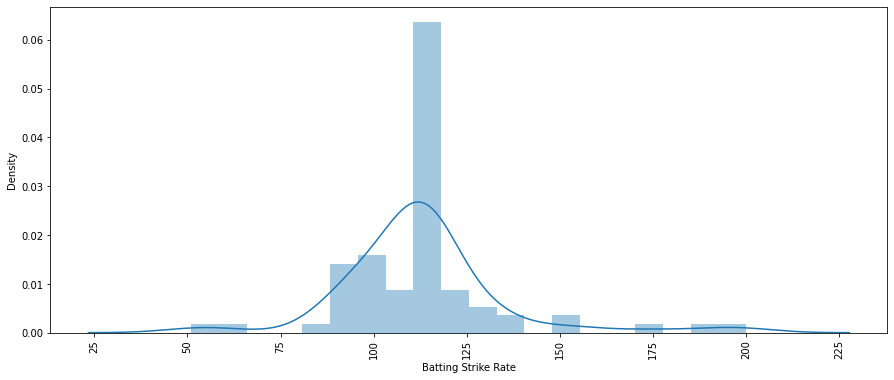

In [25]:
for i in numerical_columns:
    plt.figure(figsize=(15, 6))
    sns.distplot(df[i], kde = True, bins = 20)
    plt.xticks(rotation=90)
    plt.show()

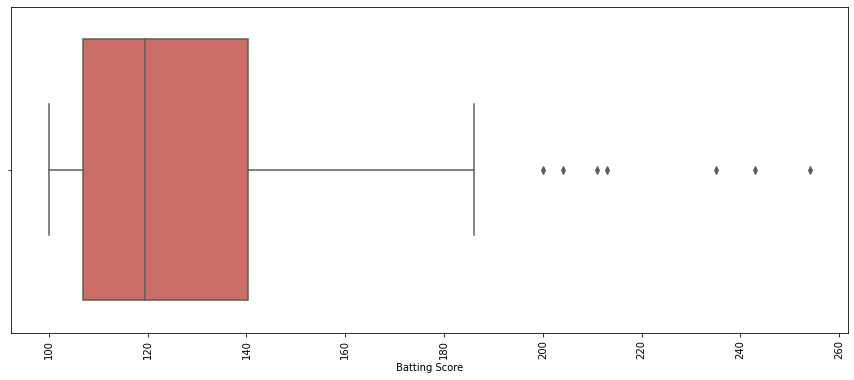

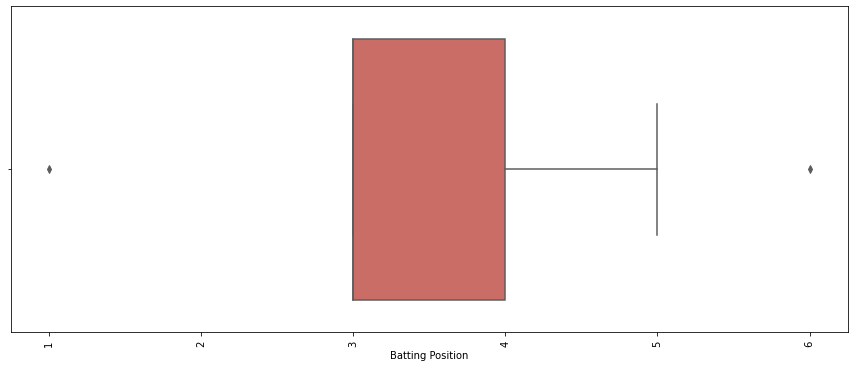

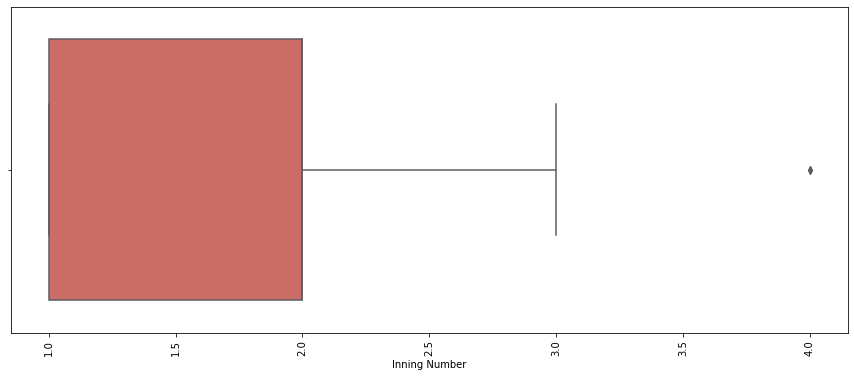

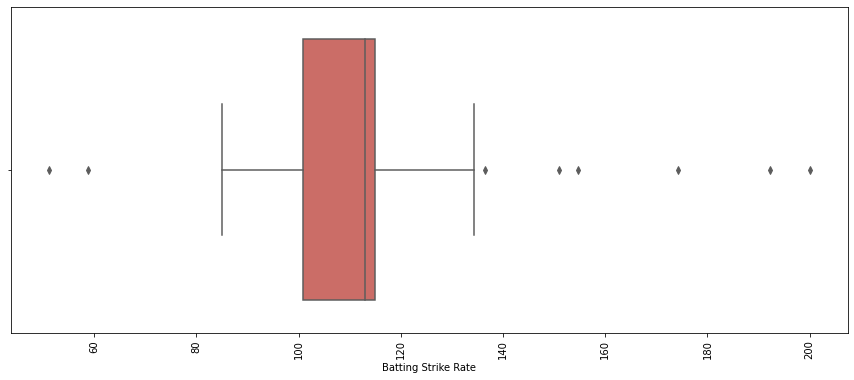

In [26]:
for i in numerical_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(df[i], data = df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

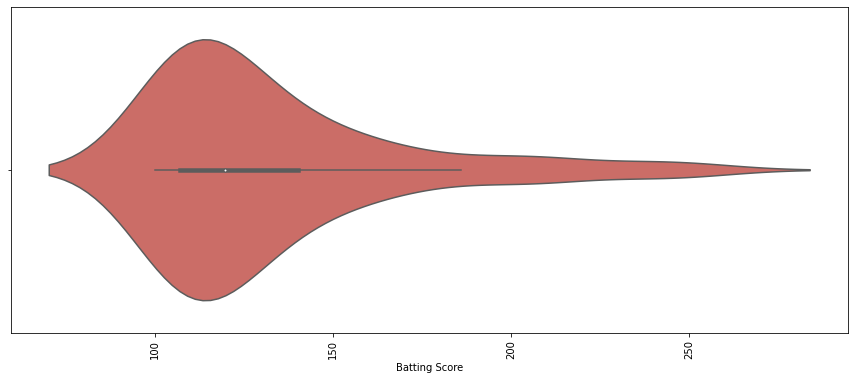

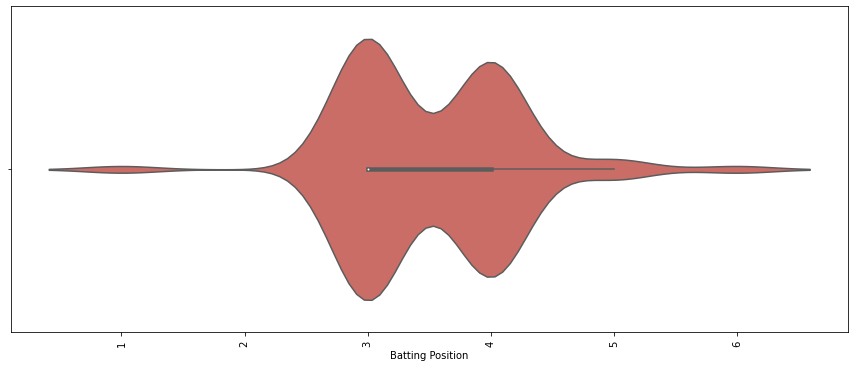

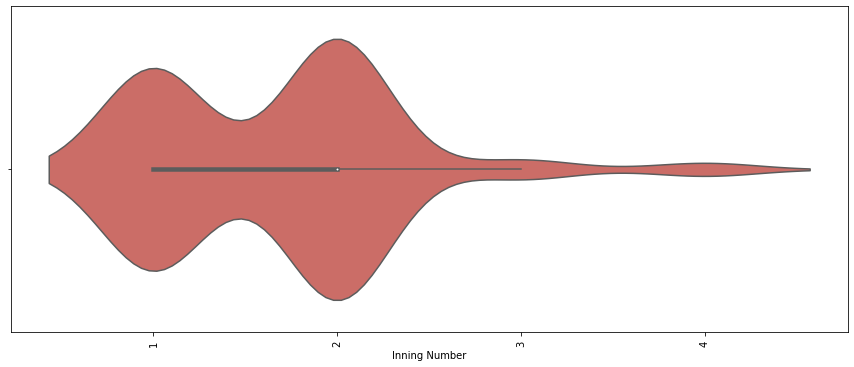

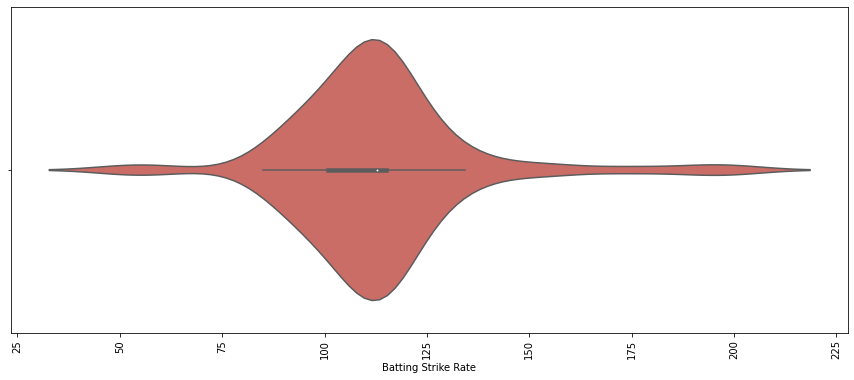

In [27]:
for i in numerical_columns:
    plt.figure(figsize=(15, 6))
    sns.violinplot(df[i], data = df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

In [28]:
for col in numerical_columns:
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=df[col], nbinsx=20, name=col, opacity=0.7))
    fig.update_layout(title=f'{col} - Histogram with Bar Lines', xaxis_title=col, yaxis_title='Frequency')
    fig.show()

In [29]:
for col in numerical_columns:
    fig = px.box(df, y=col, title=f'{col} - Box Plot')
    fig.show()

In [30]:
for col in numerical_columns:
    fig = px.violin(df, y=col, title=f'{col} - Box Plot')
    fig.show()

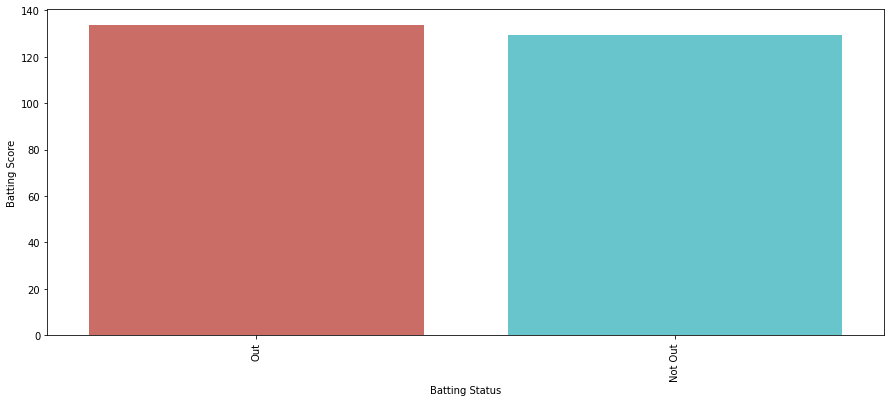

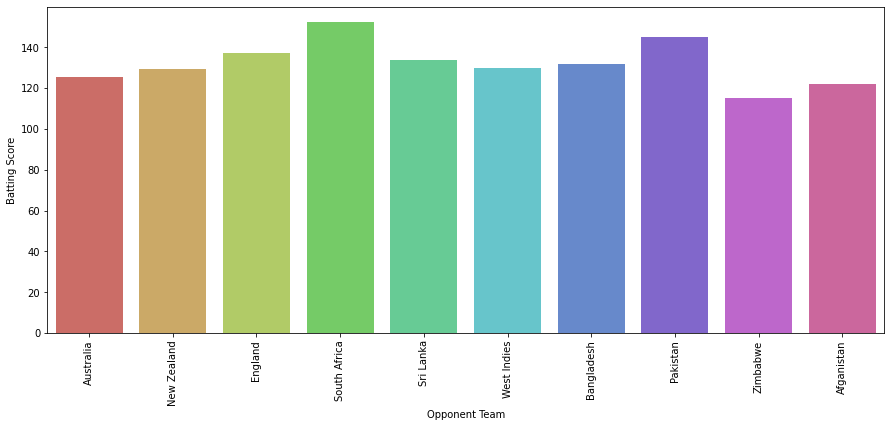

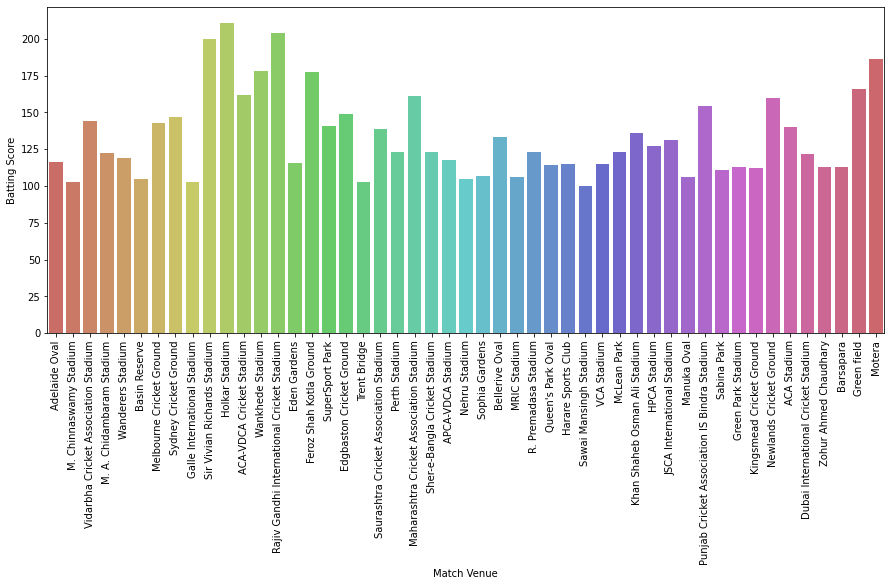

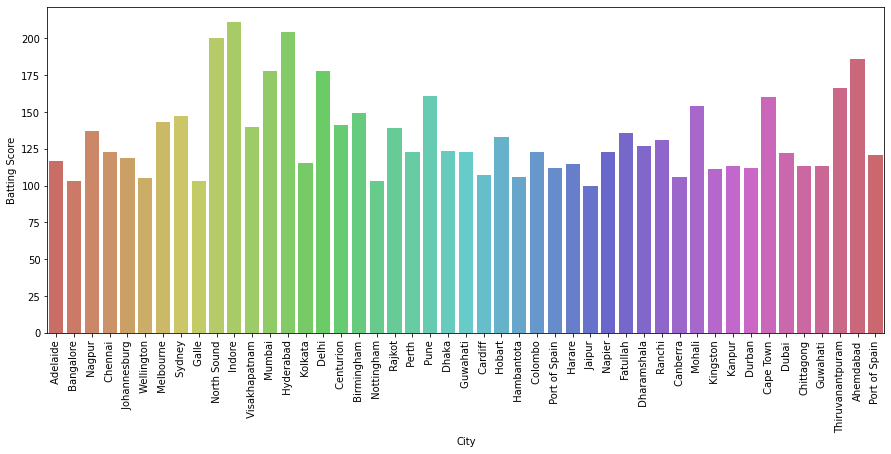

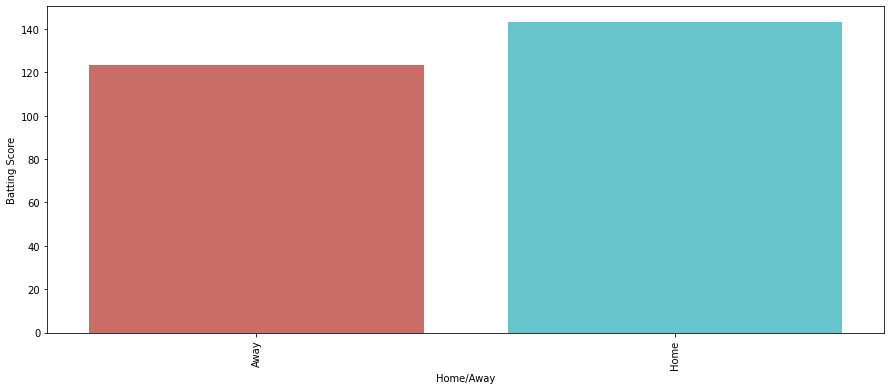

...

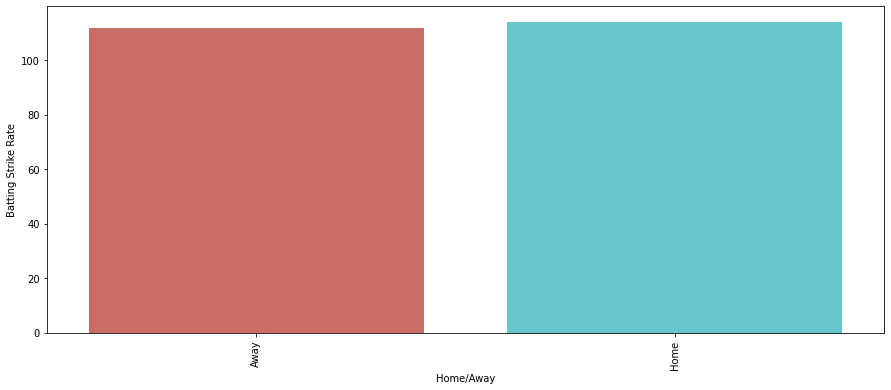

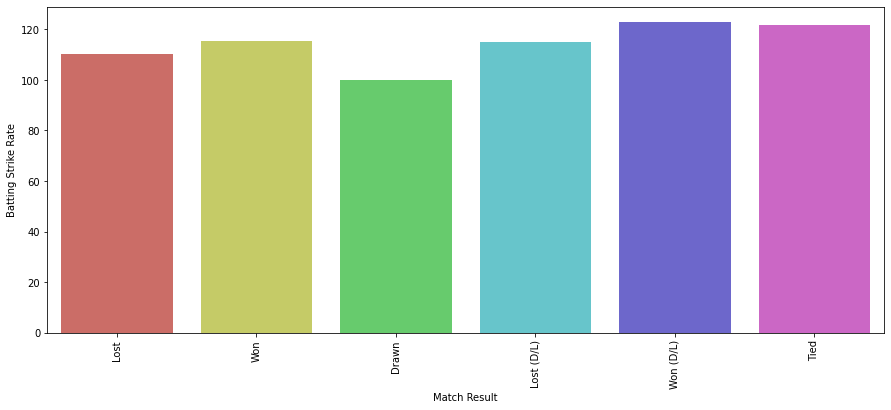

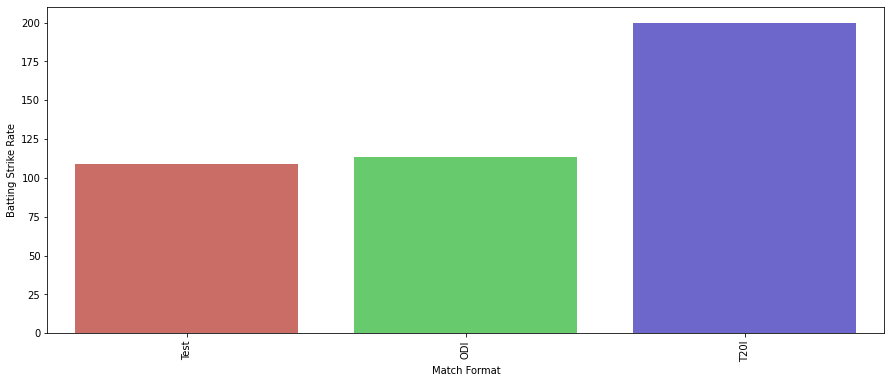

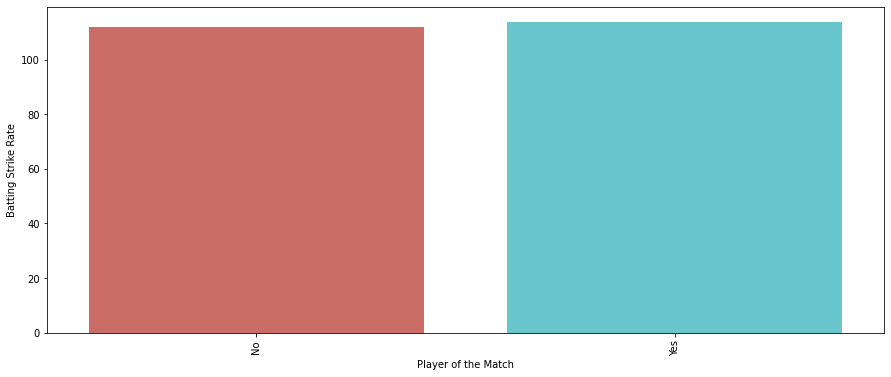

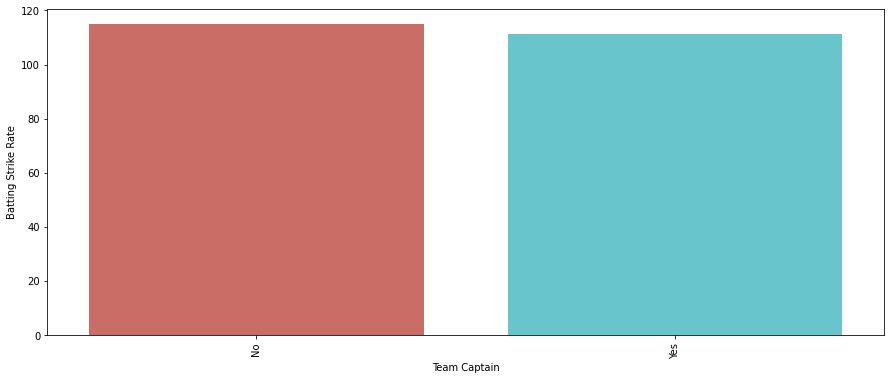

In [31]:
for i in numerical_columns:
    for j in categorical_columns:
        if j != 'Match Date':
            plt.figure(figsize=(15, 6))
            sns.barplot(x = df[j], y = df[i], ci = None, data = df, palette='hls')
            plt.xticks(rotation=90)
            plt.show()

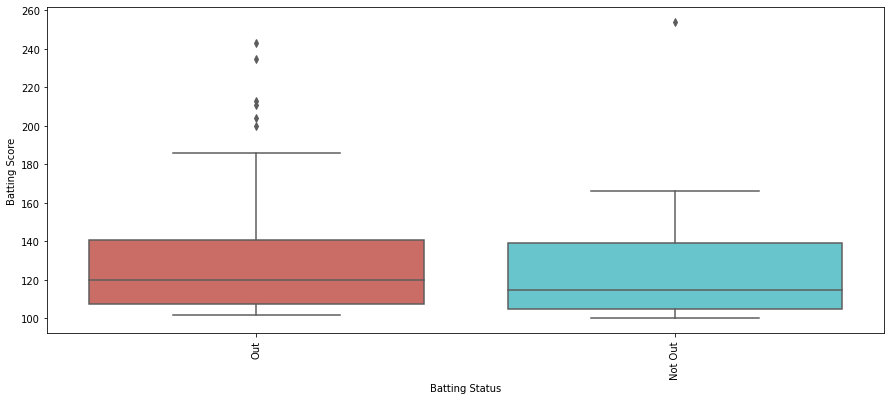

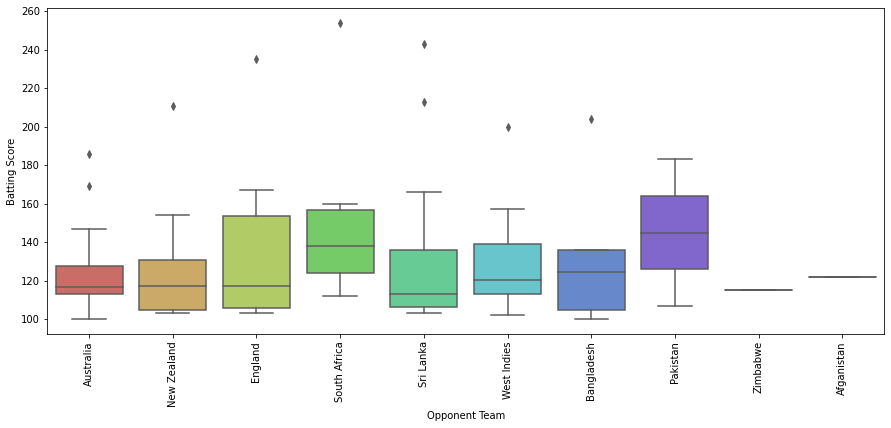

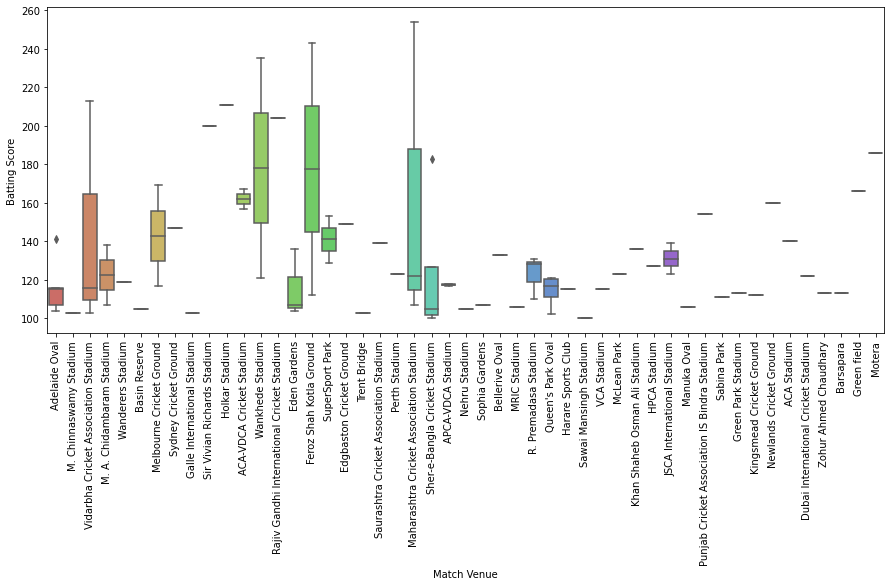

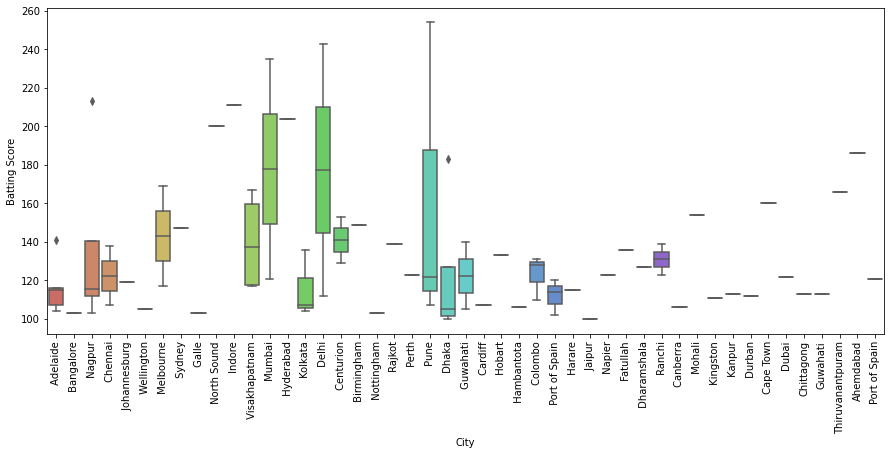

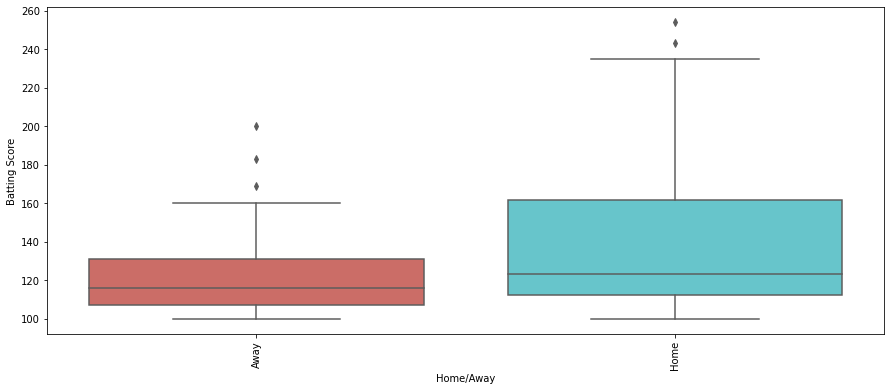

...

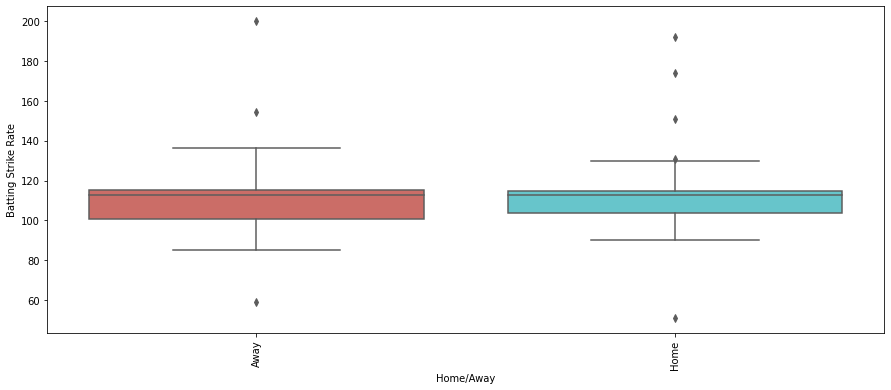

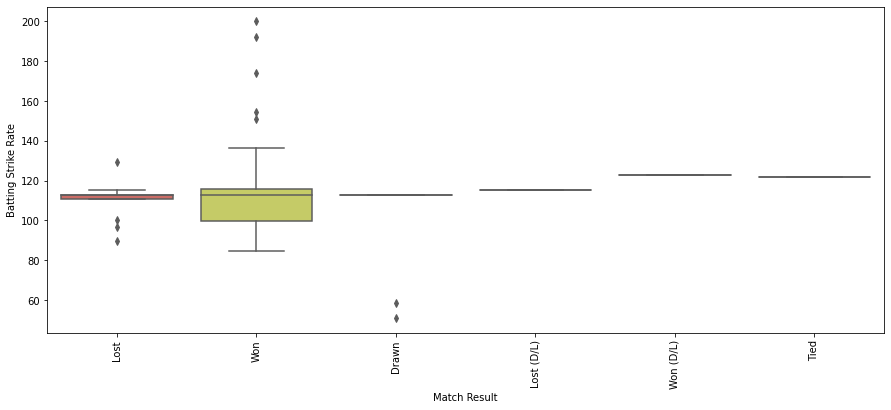

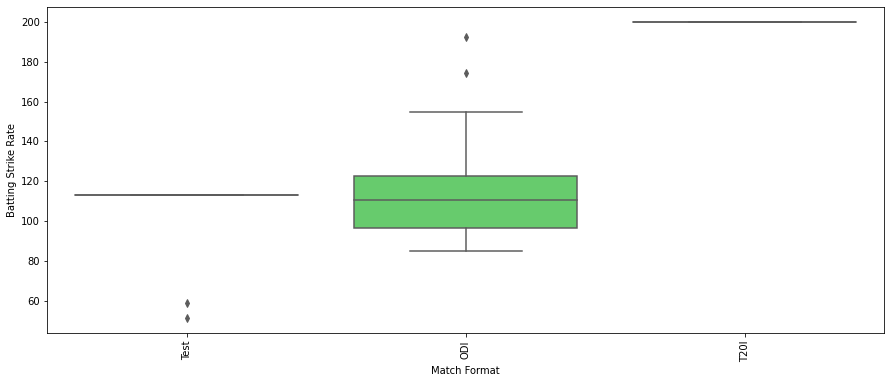

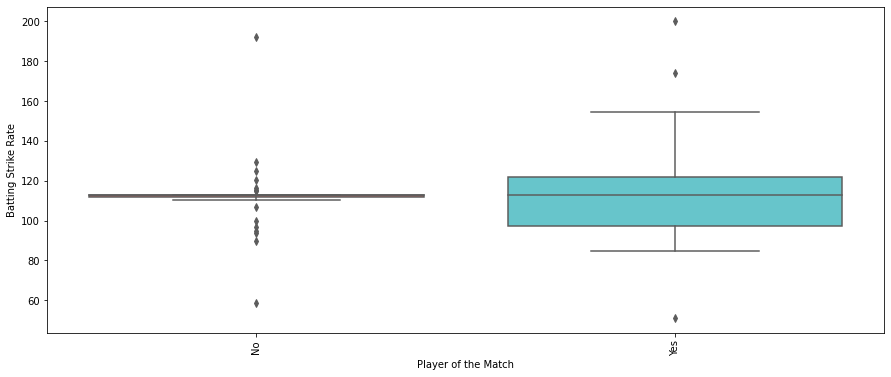

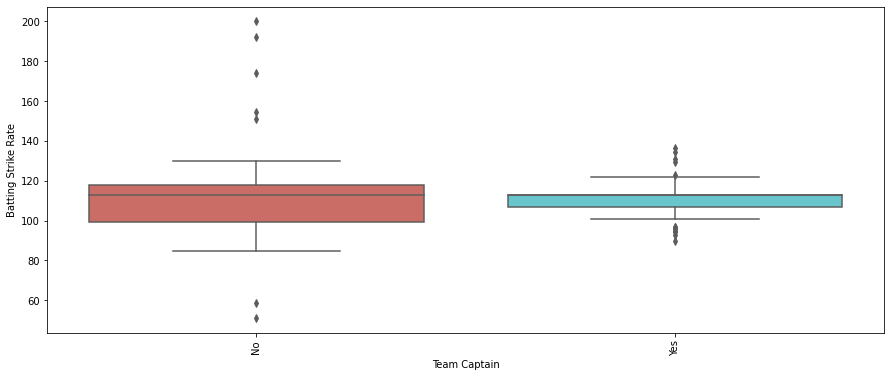

In [32]:
for i in numerical_columns:
    for j in categorical_columns:
        if j != 'Match Date':
            plt.figure(figsize=(15, 6))
            sns.boxplot(x = df[j], y = df[i], data = df, palette='hls')
            plt.xticks(rotation=90)
            plt.show()

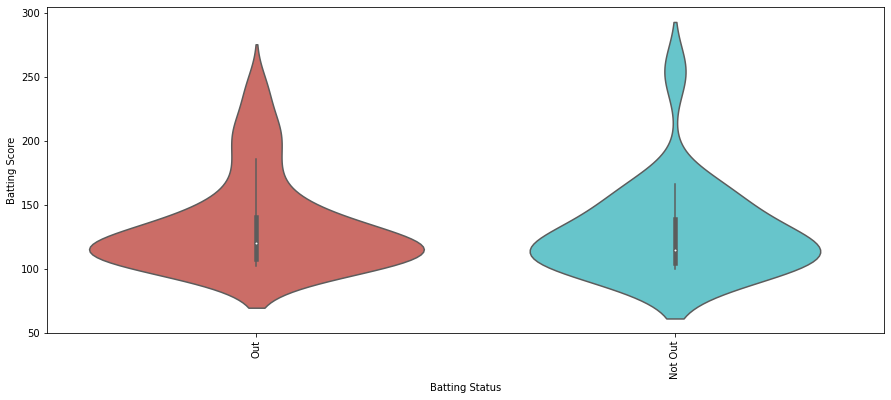

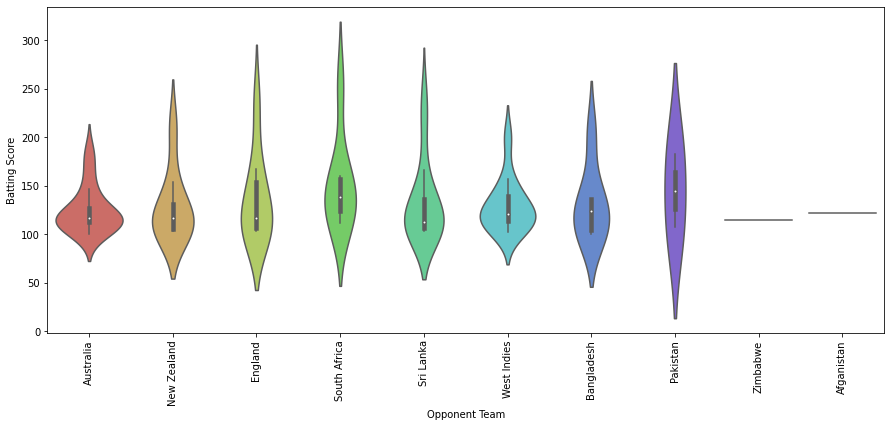

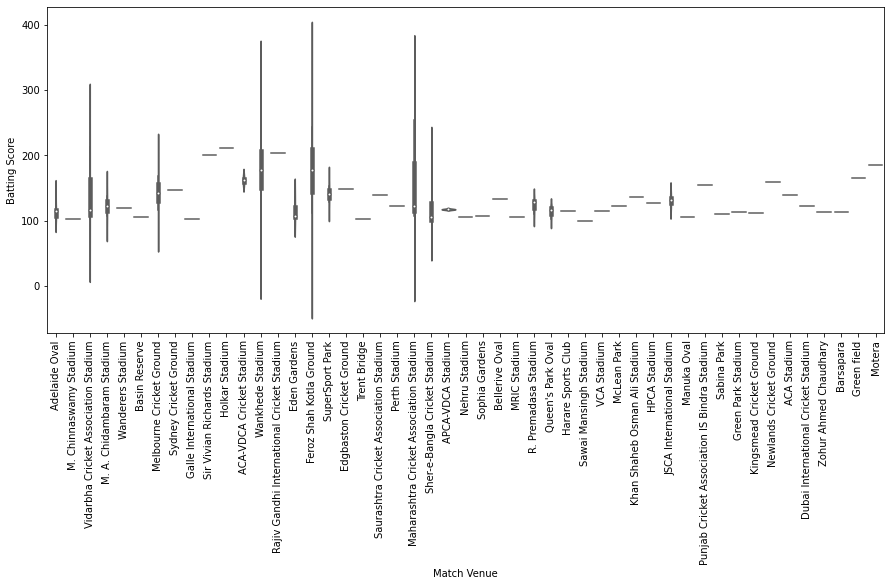

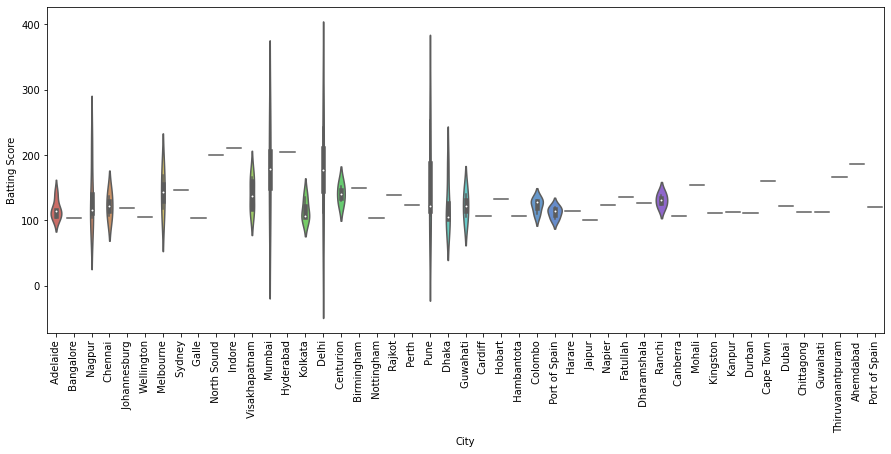

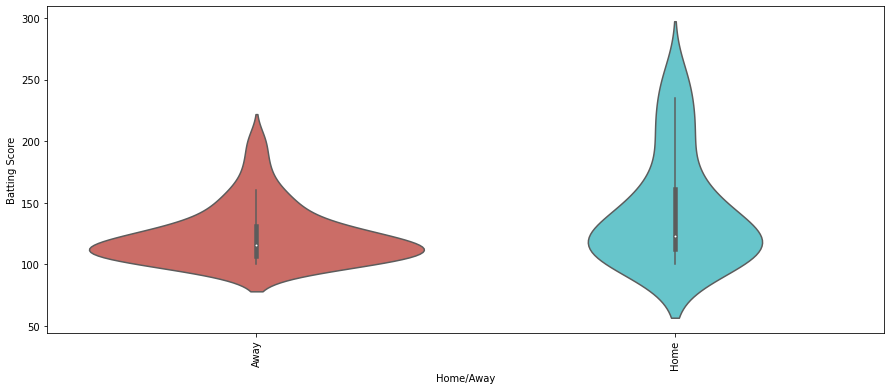

...

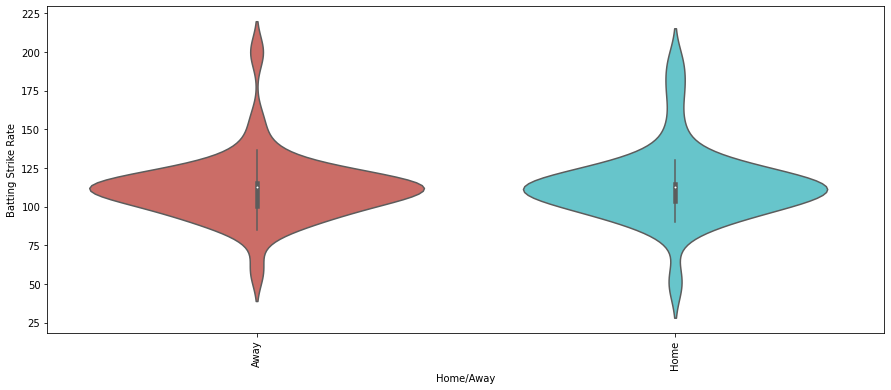

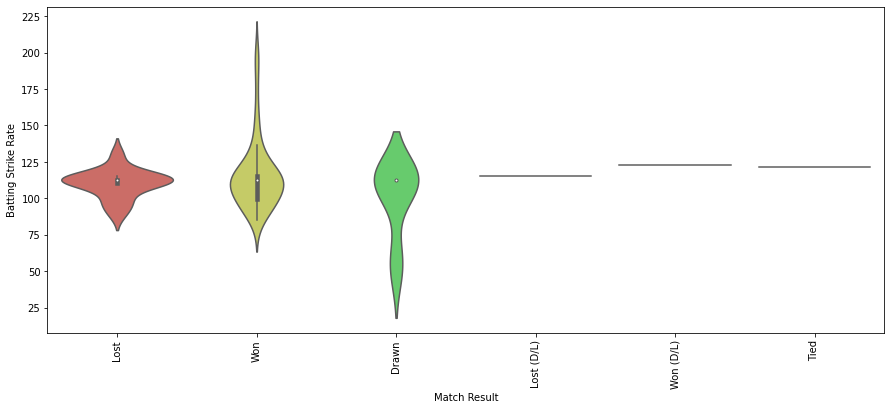

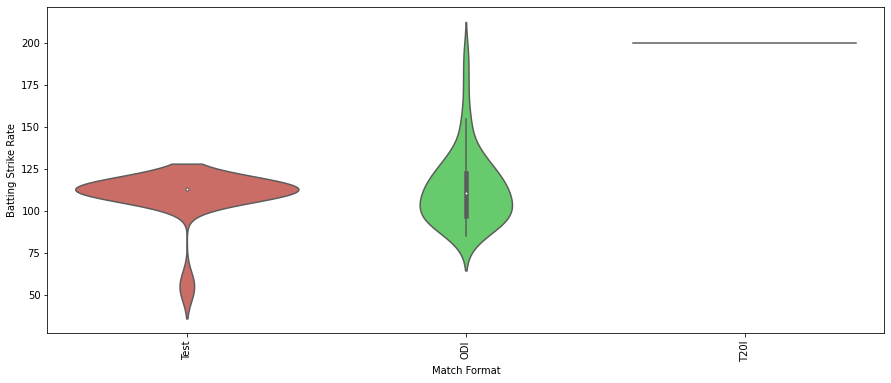

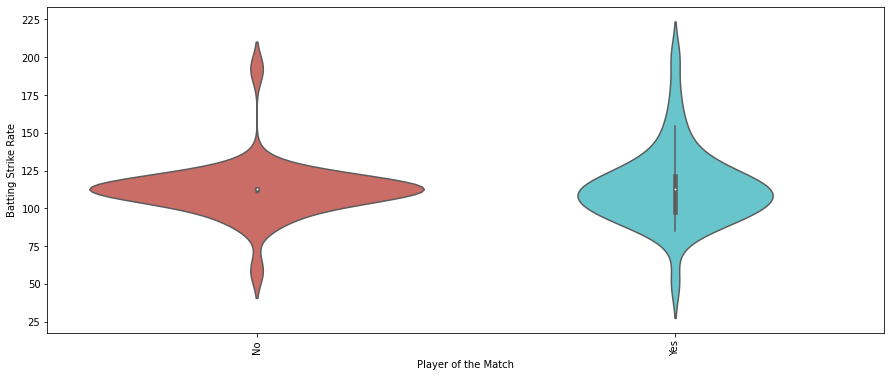

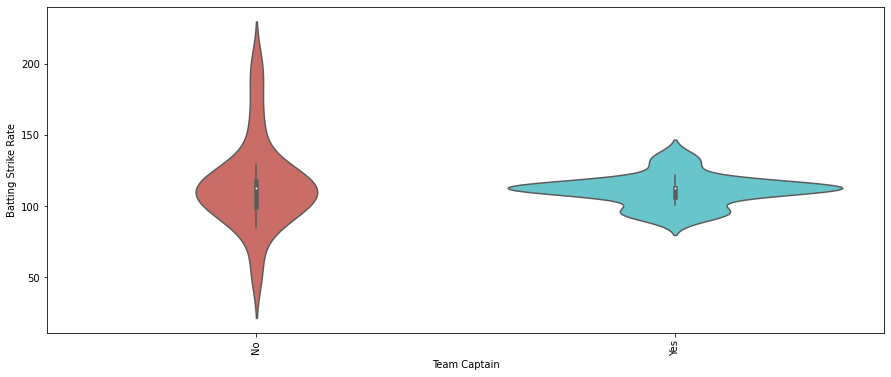

In [33]:
for i in numerical_columns:
    for j in categorical_columns:
        if j != 'Match Date':
            plt.figure(figsize=(15, 6))
            sns.violinplot(x = df[j], y = df[i], data = df, palette='hls')
            plt.xticks(rotation=90)
            plt.show()

In [34]:
for i in numerical_columns:
    for j in categorical_columns:
        fig = px.bar(df, x=j, y=i, title=f'{i} vs {j} - Bar Plot', labels={j: 'Category', i: 'Value'})
        fig.show()

In [35]:
for i in numerical_columns:
    for j in categorical_columns:
        fig = px.box(df, x=j, y=i, title=f'{i} vs {j} - Bar Plot', labels={j: 'Category', i: 'Value'})
        fig.show()

In [36]:
for i in numerical_columns:
    for j in categorical_columns:
        fig = px.violin(df, x=j, y=i, title=f'{i} vs {j} - Bar Plot', labels={j: 'Category', i: 'Value'})
        fig.show()

Crosstab Analysis between 'Batting Status' and 'Opponent Team':

Opponent Team   Afganistan  Australia  Bangladesh  England  New Zealand  \
Batting Status                                                            
Not Out                  1          2           2        1            2   
Out                      0         14           4        7            6   

Opponent Team   Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Batting Status                                                            
Not Out                0             3          7            3         0  
Out                    2             4          8            9         1  




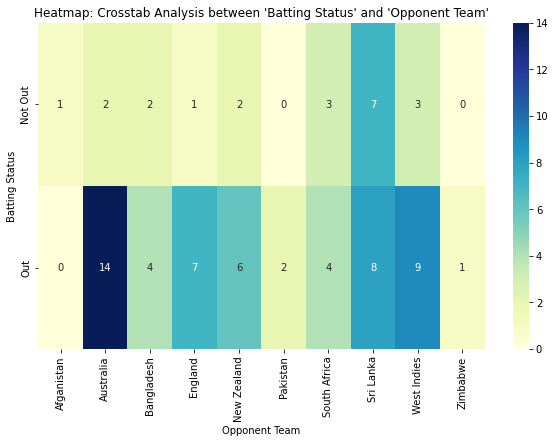

Crosstab Analysis between 'Batting Status' and 'Match Venue':

Match Venue     ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Batting Status                                                             
Not Out                   0                         1                  0   
Out                       1                         1                  2   

Match Venue     Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Batting Status                                                            
Not Out                     0          0              1               1   
Out                         5          1              0               0   

Match Venue     Dubai International Cricket Stadium  Eden Gardens  \
Batting Status                                                      
Not Out                                           1             1   
Out                                               0             2   

Match Venue     Edgbaston Cricket Ground  ...  Sir Viv

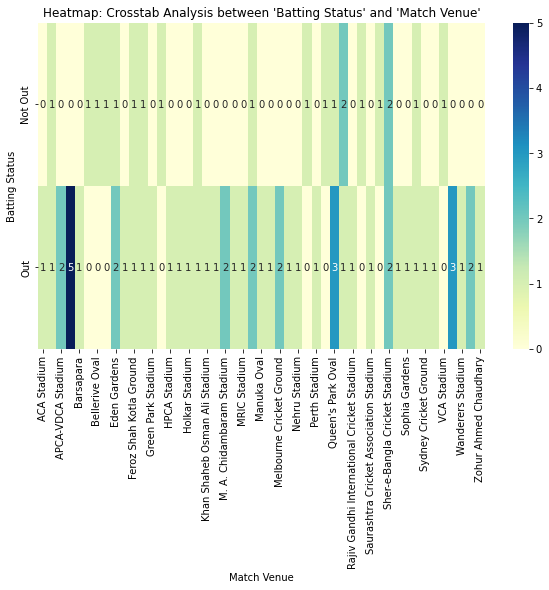

Crosstab Analysis between 'Batting Status' and 'City':

City             Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Batting Status                                                              
Not Out                 0           0            0          0           1   
Out                     5           1            1          1           0   

City             Cardiff   Centurion   Chennai   Colombo   Delhi  ...  \
Batting Status                                                    ...   
Not Out                0           1         0         2       1  ...   
Out                    1           1         2         1       1  ...   

City             Ranchi   Sydney   Visakhapatnam   Wellington  Ahemdabad  \
Batting Status                                                             
Not Out               1        0               1            1          0   
Out                   1        1               3            0          1   

City            Chittagong  Dubai  Gu

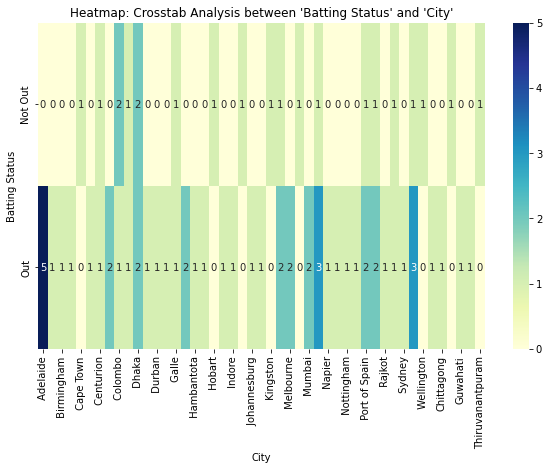

Crosstab Analysis between 'Batting Status' and 'Home/Away':

Home/Away       Away  Home
Batting Status            
Not Out           12     9
Out               29    26




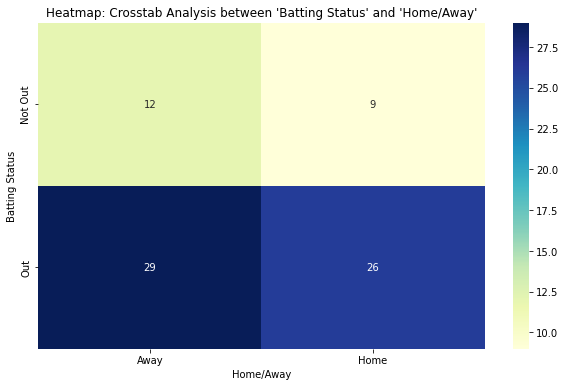

Crosstab Analysis between 'Batting Status' and 'Match Date':

Match Date      01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Batting Status                                                               
Not Out                  0           0           0           0           1   
Out                      1           1           1           1           0   

Match Date      04-10-2018  05-03-2019  05-07-2013  06-01-2015  06-07-2017  \
Batting Status                                                               
Not Out                  0           0           0           0           1   
Out                      1           1           1           1           0   

Match Date      ...  26-07-2017  26-12-2014  27-10-2018  28-02-2012  \
Batting Status  ...                                                   
Not Out         ...           1           0           0           1   
Out             ...           0           1           1           0   

Match Date      28-11-2010 

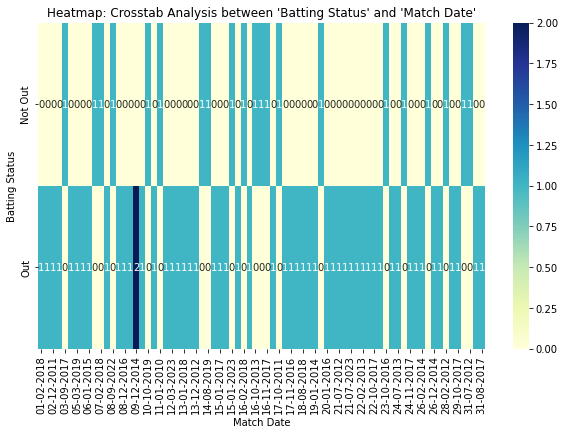

Crosstab Analysis between 'Batting Status' and 'Match Result':

Match Result    Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Batting Status                                               
Not Out             2     0           0     1   18          0
Out                 7    13           1     0   33          1




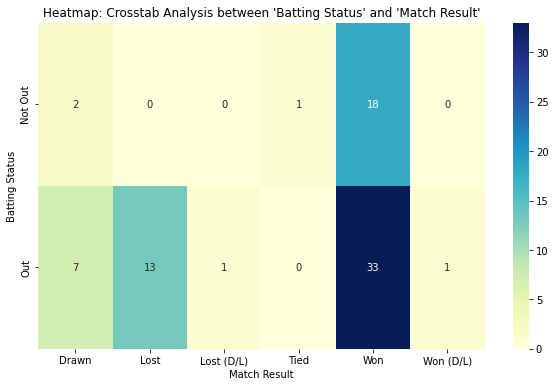

Crosstab Analysis between 'Batting Status' and 'Match Format':

Match Format    ODI  T20I  Test
Batting Status                 
Not Out          16     1     4
Out              30     0    25




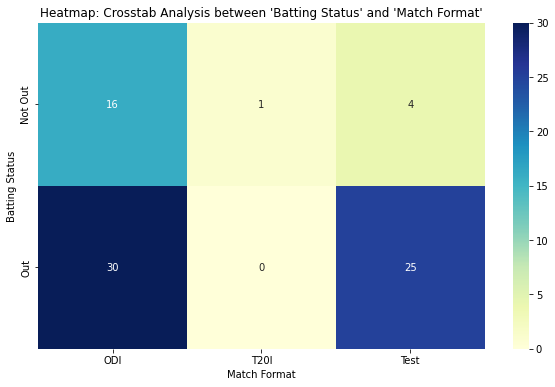

Crosstab Analysis between 'Batting Status' and 'Player of the Match':

Player of the Match  No  Yes
Batting Status              
Not Out               7   14
Out                  28   27




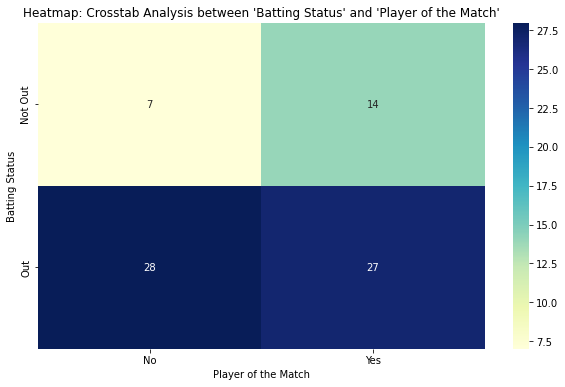

Crosstab Analysis between 'Batting Status' and 'Team Captain':

Team Captain    No  Yes
Batting Status         
Not Out         11   10
Out             24   31




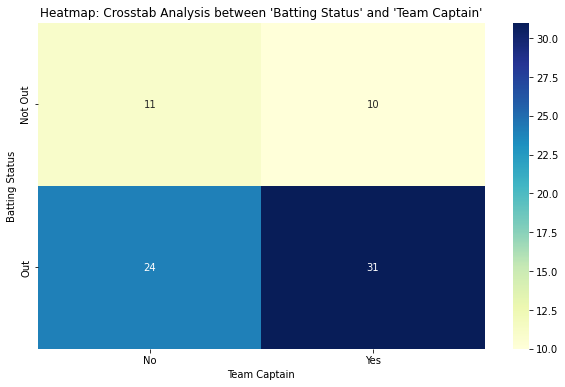

Crosstab Analysis between 'Opponent Team' and 'Batting Status':

Batting Status  Not Out  Out
Opponent Team               
Afganistan            1    0
Australia             2   14
Bangladesh            2    4
England               1    7
New Zealand           2    6
Pakistan              0    2
South Africa          3    4
Sri Lanka             7    8
West Indies           3    9
Zimbabwe              0    1




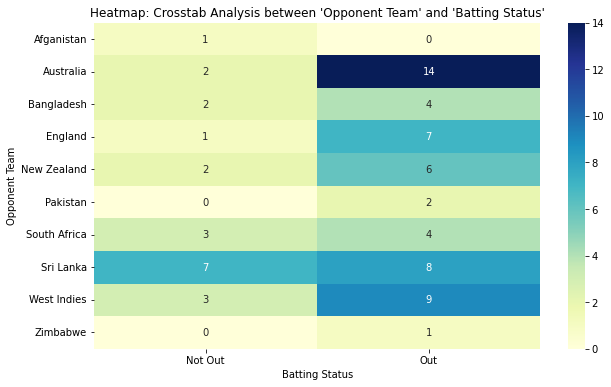

Crosstab Analysis between 'Opponent Team' and 'Match Venue':

Match Venue    ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Opponent Team                                                             
Afganistan               0                         0                  0   
Australia                0                         0                  1   
Bangladesh               0                         0                  0   
England                  0                         1                  0   
New Zealand              0                         0                  0   
Pakistan                 0                         0                  0   
South Africa             0                         0                  0   
Sri Lanka                0                         0                  0   
West Indies              1                         1                  1   
Zimbabwe                 0                         0                  0   

Match Venue    Adelaide Oval  Barsapa

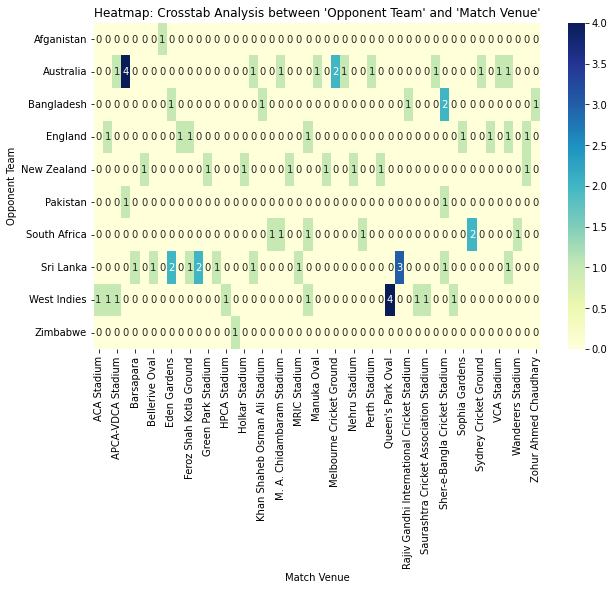

Crosstab Analysis between 'Opponent Team' and 'City':

City            Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Opponent Team                                                              
Afganistan             0           0            0          0           0   
Australia              4           0            0          1           0   
Bangladesh             0           0            0          0           0   
England                0           0            1          0           0   
New Zealand            0           1            0          0           0   
Pakistan               1           0            0          0           0   
South Africa           0           0            0          0           1   
Sri Lanka              0           0            0          0           0   
West Indies            0           0            0          0           0   
Zimbabwe               0           0            0          0           0   

City            Cardiff   Centur

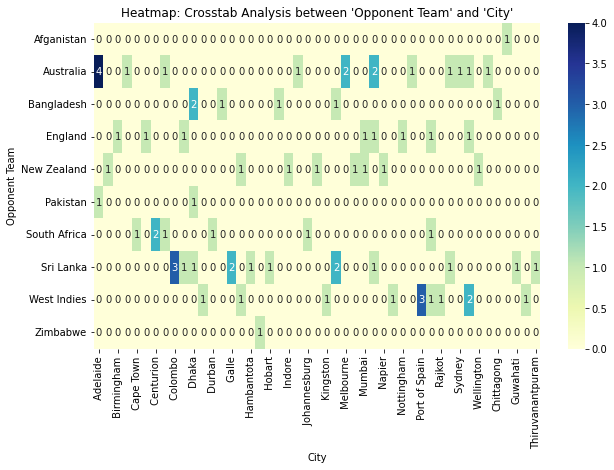

Crosstab Analysis between 'Opponent Team' and 'Home/Away':

Home/Away      Away  Home
Opponent Team            
Afganistan        1     0
Australia         9     7
Bangladesh        4     2
England           3     5
New Zealand       2     6
Pakistan          2     0
South Africa      5     2
Sri Lanka         8     7
West Indies       6     6
Zimbabwe          1     0




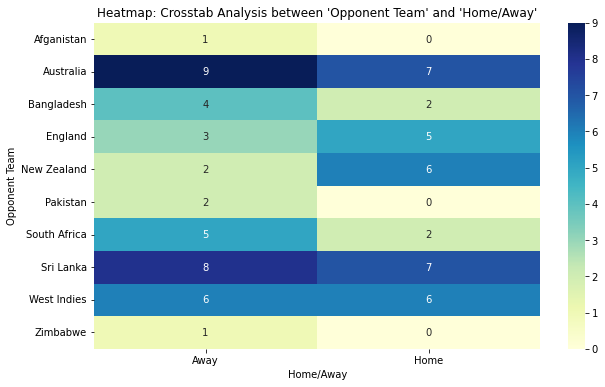

Crosstab Analysis between 'Opponent Team' and 'Match Date':

Match Date     01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Opponent Team                                                               
Afganistan              0           0           0           0           0   
Australia               0           0           0           0           0   
Bangladesh              0           0           0           0           0   
England                 0           1           0           0           0   
New Zealand             0           0           0           0           0   
Pakistan                0           0           0           0           0   
South Africa            1           0           0           0           0   
Sri Lanka               0           0           0           1           1   
West Indies             0           0           1           0           0   
Zimbabwe                0           0           0           0           0   

Match Date    

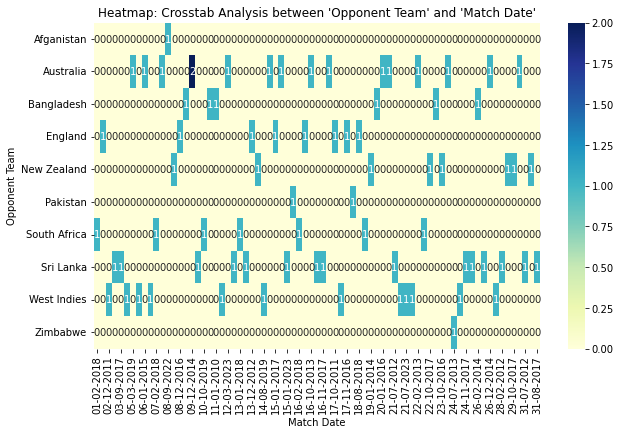

Crosstab Analysis between 'Opponent Team' and 'Match Result':

Match Result   Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Opponent Team                                               
Afganistan         0     0           0     0    1          0
Australia          3     7           0     0    6          0
Bangladesh         0     0           0     0    6          0
England            1     1           1     0    5          0
New Zealand        1     2           0     0    5          0
Pakistan           0     0           0     0    2          0
South Africa       1     1           0     0    5          0
Sri Lanka          2     1           0     0   12          0
West Indies        1     1           0     1    8          1
Zimbabwe           0     0           0     0    1          0




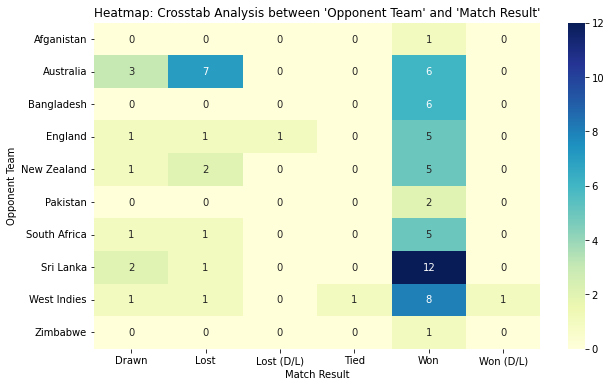

Crosstab Analysis between 'Opponent Team' and 'Match Format':

Match Format   ODI  T20I  Test
Opponent Team                 
Afganistan       0     1     0
Australia        8     0     8
Bangladesh       4     0     2
England          3     0     5
New Zealand      5     0     3
Pakistan         2     0     0
South Africa     4     0     3
Sri Lanka       10     0     5
West Indies      9     0     3
Zimbabwe         1     0     0




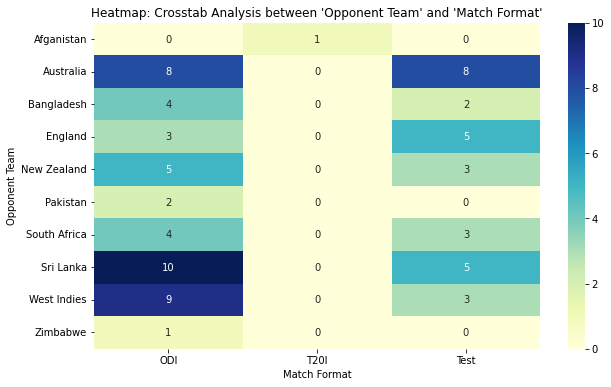

Crosstab Analysis between 'Opponent Team' and 'Player of the Match':

Player of the Match  No  Yes
Opponent Team               
Afganistan            0    1
Australia            11    5
Bangladesh            3    3
England               4    4
New Zealand           5    3
Pakistan              0    2
South Africa          2    5
Sri Lanka             6    9
West Indies           4    8
Zimbabwe              0    1




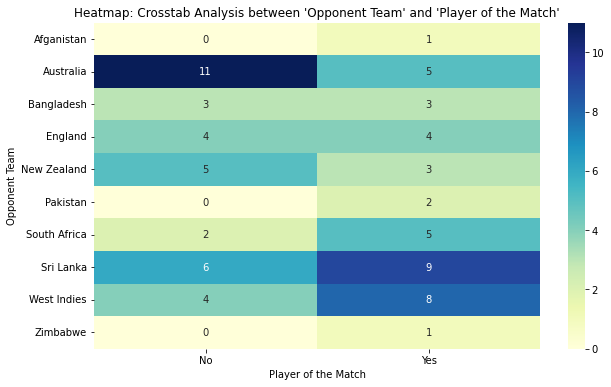

Crosstab Analysis between 'Opponent Team' and 'Team Captain':

Team Captain   No  Yes
Opponent Team         
Afganistan      1    0
Australia       9    7
Bangladesh      3    3
England         3    5
New Zealand     5    3
Pakistan        2    0
South Africa    2    5
Sri Lanka       7    8
West Indies     3    9
Zimbabwe        0    1




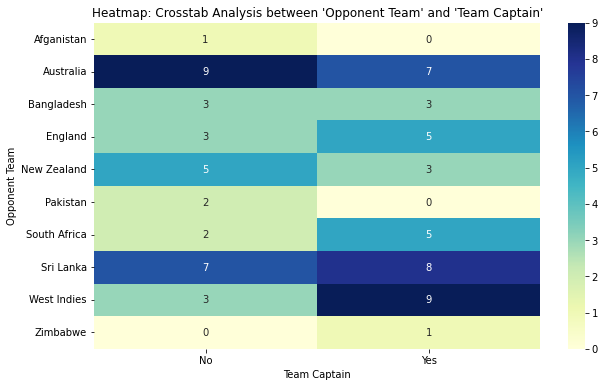

Crosstab Analysis between 'Match Venue' and 'Batting Status':

Batting Status                                Not Out  Out
Match Venue                                               
ACA Stadium                                         0    1
ACA-VDCA Cricket Stadium                            1    1
APCA-VDCA Stadium                                   0    2
Adelaide Oval                                       0    5
Barsapara                                           0    1
Basin Reserve                                       1    0
Bellerive Oval                                      1    0
Dubai International Cricket Stadium                 1    0
Eden Gardens                                        1    2
Edgbaston Cricket Ground                            0    1
Feroz Shah Kotla Ground                             1    1
Galle International Stadium                         1    1
Green Park Stadium                                  0    1
Green field                                         

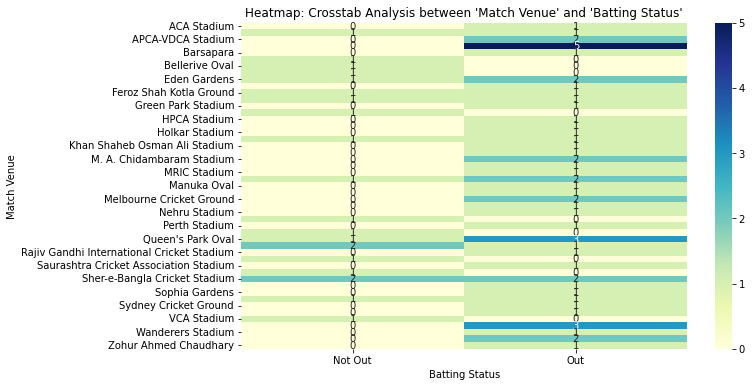

Crosstab Analysis between 'Match Venue' and 'Opponent Team':

Opponent Team                                 Afganistan  Australia  \
Match Venue                                                           
ACA Stadium                                            0          0   
ACA-VDCA Cricket Stadium                               0          0   
APCA-VDCA Stadium                                      0          1   
Adelaide Oval                                          0          4   
Barsapara                                              0          0   
Basin Reserve                                          0          0   
Bellerive Oval                                         0          0   
Dubai International Cricket Stadium                    1          0   
Eden Gardens                                           0          0   
Edgbaston Cricket Ground                               0          0   
Feroz Shah Kotla Ground                                0          0   
Galle Internati

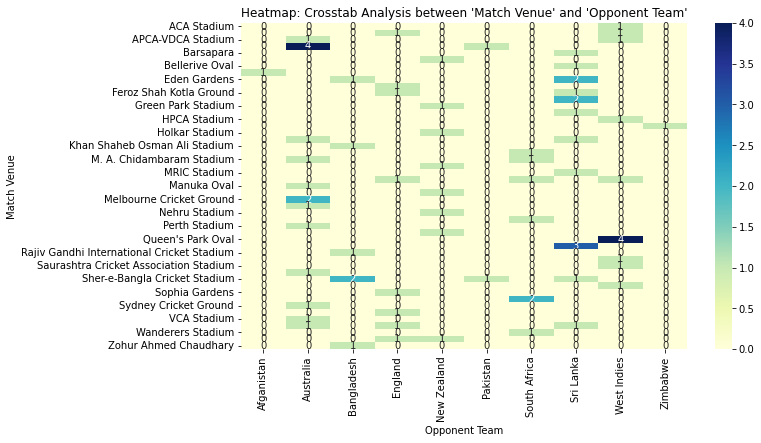

Crosstab Analysis between 'Match Venue' and 'City':

City                                           Adelaide   Bangalore  \
Match Venue                                                           
ACA Stadium                                           0           0   
ACA-VDCA Cricket Stadium                              0           0   
APCA-VDCA Stadium                                     0           0   
Adelaide Oval                                         5           0   
Barsapara                                             0           0   
Basin Reserve                                         0           0   
Bellerive Oval                                        0           0   
Dubai International Cricket Stadium                   0           0   
Eden Gardens                                          0           0   
Edgbaston Cricket Ground                              0           0   
Feroz Shah Kotla Ground                               0           0   
Galle International Stad

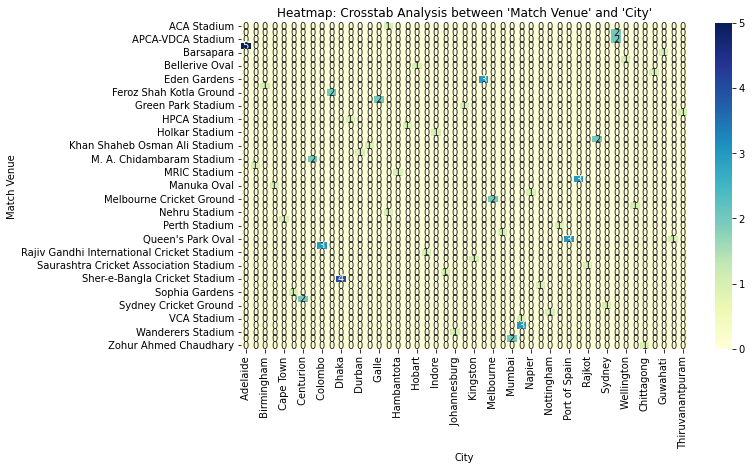

Crosstab Analysis between 'Match Venue' and 'Home/Away':

Home/Away                                     Away  Home
Match Venue                                             
ACA Stadium                                      0     1
ACA-VDCA Cricket Stadium                         0     2
APCA-VDCA Stadium                                0     2
Adelaide Oval                                    5     0
Barsapara                                        0     1
Basin Reserve                                    1     0
Bellerive Oval                                   1     0
Dubai International Cricket Stadium              1     0
Eden Gardens                                     0     3
Edgbaston Cricket Ground                         1     0
Feroz Shah Kotla Ground                          0     2
Galle International Stadium                      2     0
Green Park Stadium                               0     1
Green field                                      0     1
HPCA Stadium                  

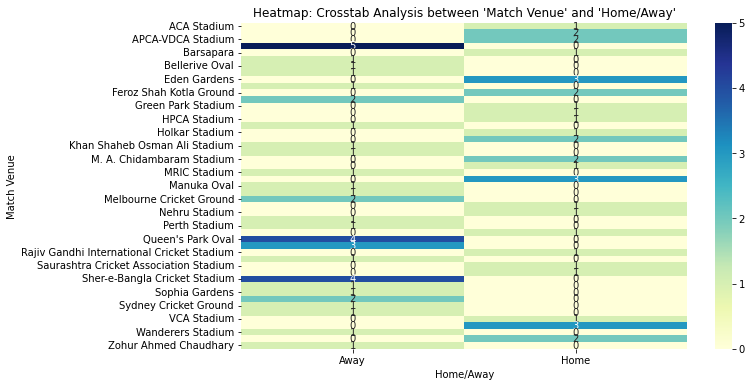

Crosstab Analysis between 'Match Venue' and 'Match Date':

Match Date                                    01-02-2018  01-08-2018  \
Match Venue                                                            
ACA Stadium                                            0           0   
ACA-VDCA Cricket Stadium                               0           0   
APCA-VDCA Stadium                                      0           0   
Adelaide Oval                                          0           0   
Barsapara                                              0           0   
Basin Reserve                                          0           0   
Bellerive Oval                                         0           0   
Dubai International Cricket Stadium                    0           0   
Eden Gardens                                           0           0   
Edgbaston Cricket Ground                               0           1   
Feroz Shah Kotla Ground                                0           0   
Galle

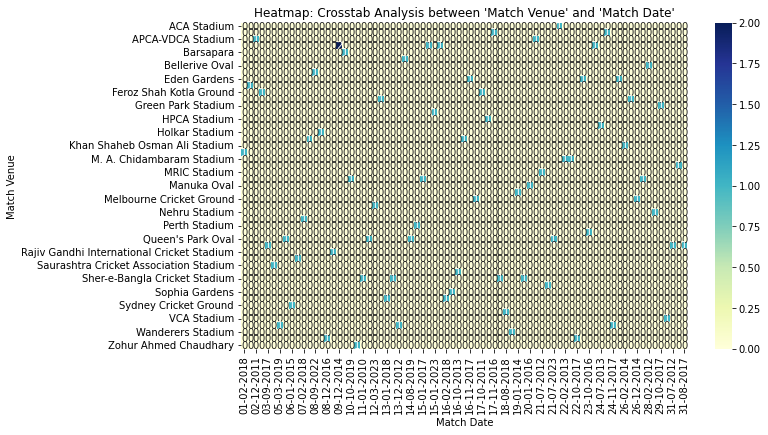

Crosstab Analysis between 'Match Venue' and 'Match Result':

Match Result                                  Drawn  Lost  Lost (D/L)  Tied  \
Match Venue                                                                   
ACA Stadium                                       0     0           0     0   
ACA-VDCA Cricket Stadium                          0     0           0     1   
APCA-VDCA Stadium                                 0     0           0     0   
Adelaide Oval                                     0     3           0     0   
Barsapara                                         0     0           0     0   
Basin Reserve                                     1     0           0     0   
Bellerive Oval                                    0     0           0     0   
Dubai International Cricket Stadium               0     0           0     0   
Eden Gardens                                      1     0           0     0   
Edgbaston Cricket Ground                          0     1           0 

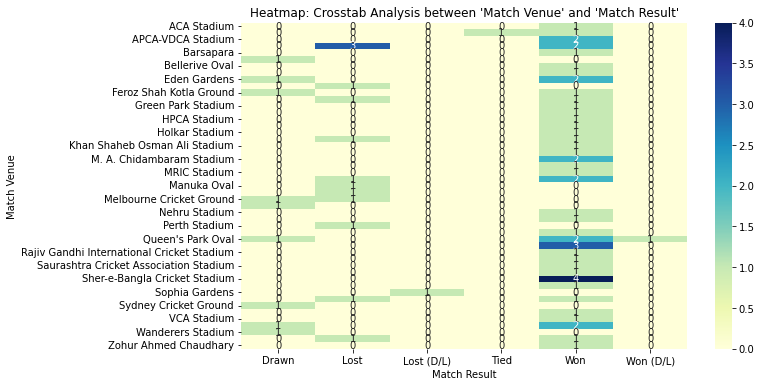

Crosstab Analysis between 'Match Venue' and 'Match Format':

Match Format                                  ODI  T20I  Test
Match Venue                                                  
ACA Stadium                                     1     0     0
ACA-VDCA Cricket Stadium                        1     0     1
APCA-VDCA Stadium                               2     0     0
Adelaide Oval                                   2     0     3
Barsapara                                       1     0     0
Basin Reserve                                   0     0     1
Bellerive Oval                                  1     0     0
Dubai International Cricket Stadium             0     1     0
Eden Gardens                                    1     0     2
Edgbaston Cricket Ground                        0     0     1
Feroz Shah Kotla Ground                         1     0     1
Galle International Stadium                     0     0     2
Green Park Stadium                              1     0     0
Green fie

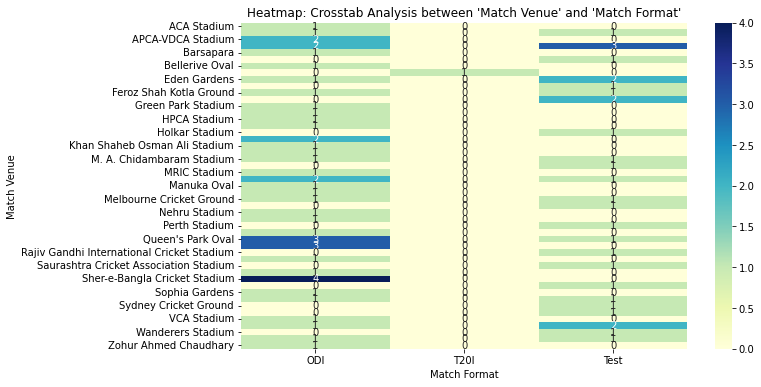

Crosstab Analysis between 'Match Venue' and 'Player of the Match':

Player of the Match                           No  Yes
Match Venue                                          
ACA Stadium                                    0    1
ACA-VDCA Cricket Stadium                       0    2
APCA-VDCA Stadium                              0    2
Adelaide Oval                                  3    2
Barsapara                                      0    1
Basin Reserve                                  1    0
Bellerive Oval                                 0    1
Dubai International Cricket Stadium            0    1
Eden Gardens                                   3    0
Edgbaston Cricket Ground                       1    0
Feroz Shah Kotla Ground                        0    2
Galle International Stadium                    2    0
Green Park Stadium                             1    0
Green field                                    0    1
HPCA Stadium                                   0    1
Harare Sports 

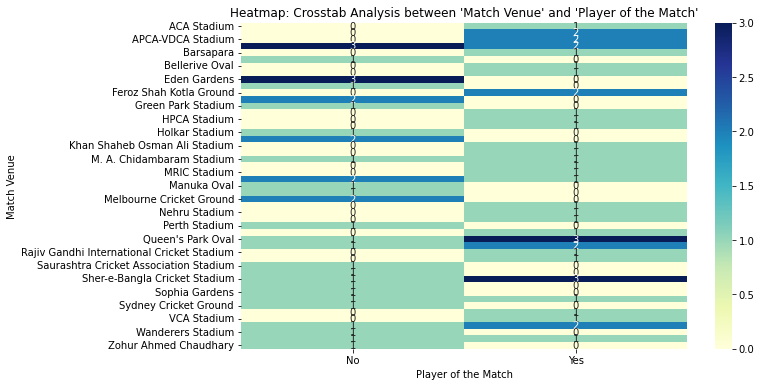

Crosstab Analysis between 'Match Venue' and 'Team Captain':

Team Captain                                  No  Yes
Match Venue                                          
ACA Stadium                                    0    1
ACA-VDCA Cricket Stadium                       0    2
APCA-VDCA Stadium                              2    0
Adelaide Oval                                  2    3
Barsapara                                      1    0
Basin Reserve                                  1    0
Bellerive Oval                                 1    0
Dubai International Cricket Stadium            1    0
Eden Gardens                                   1    2
Edgbaston Cricket Ground                       0    1
Feroz Shah Kotla Ground                        1    1
Galle International Stadium                    0    2
Green Park Stadium                             0    1
Green field                                    1    0
HPCA Stadium                                   1    0
Harare Sports Club   

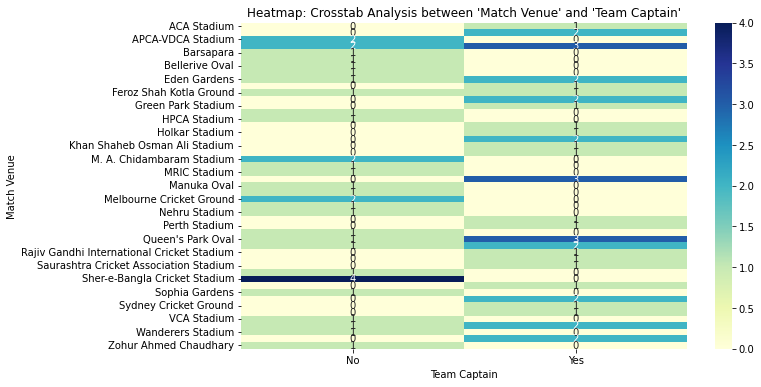

Crosstab Analysis between 'City' and 'Batting Status':

Batting Status    Not Out  Out
City                          
 Adelaide               0    5
 Bangalore              0    1
 Birmingham             0    1
 Canberra               0    1
 Cape Town              1    0
 Cardiff                0    1
 Centurion              1    1
 Chennai                0    2
 Colombo                2    1
 Delhi                  1    1
 Dhaka                  2    2
 Dharamshala            0    1
 Durban                 0    1
 Fatullah               0    1
 Galle                  1    1
 Guwahati               0    2
 Hambantota             0    1
 Harare                 0    1
 Hobart                 1    0
 Hyderabad              0    1
 Indore                 0    1
 Jaipur                 1    0
 Johannesburg           0    1
 Kanpur                 0    1
 Kingston               1    0
 Kolkata                1    2
 Melbourne              0    2
 Mohali                 1    0
 Mumbai       

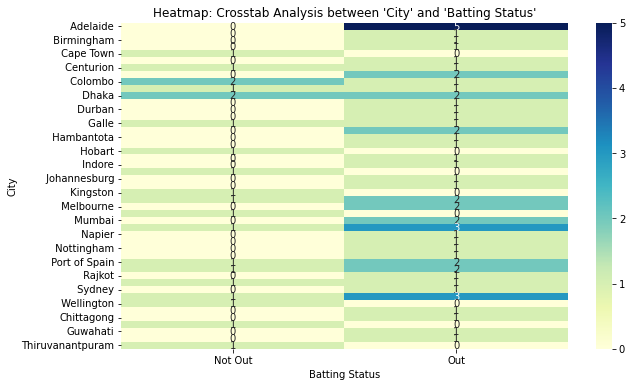

Crosstab Analysis between 'City' and 'Opponent Team':

Opponent Team     Afganistan  Australia  Bangladesh  England  New Zealand  \
City                                                                        
 Adelaide                  0          4           0        0            0   
 Bangalore                 0          0           0        0            1   
 Birmingham                0          0           0        1            0   
 Canberra                  0          1           0        0            0   
 Cape Town                 0          0           0        0            0   
 Cardiff                   0          0           0        1            0   
 Centurion                 0          0           0        0            0   
 Chennai                   0          1           0        0            0   
 Colombo                   0          0           0        0            0   
 Delhi                     0          0           0        1            0   
 Dhaka               

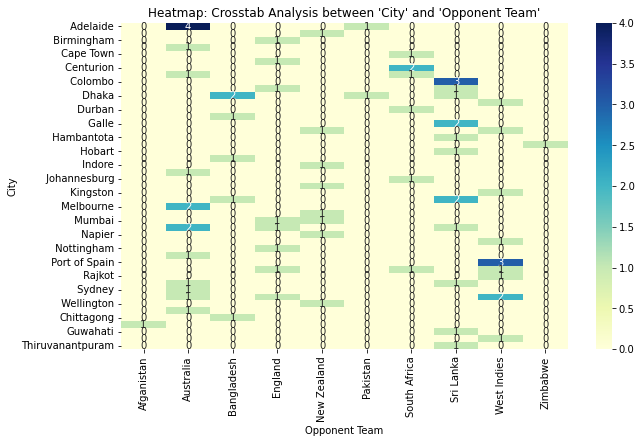

Crosstab Analysis between 'City' and 'Match Venue':

Match Venue       ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
City                                                                         
 Adelaide                   0                         0                  0   
 Bangalore                  0                         0                  0   
 Birmingham                 0                         0                  0   
 Canberra                   0                         0                  0   
 Cape Town                  0                         0                  0   
 Cardiff                    0                         0                  0   
 Centurion                  0                         0                  0   
 Chennai                    0                         0                  0   
 Colombo                    0                         0                  0   
 Delhi                      0                         0                  0   
 Dhaka     

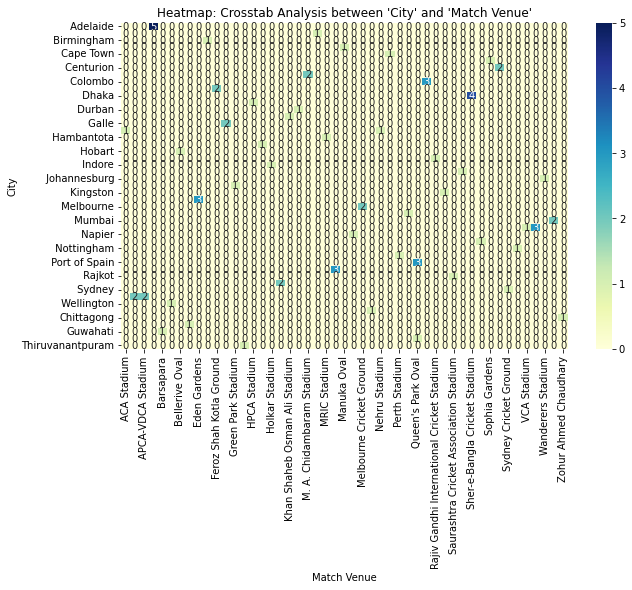

Crosstab Analysis between 'City' and 'Home/Away':

Home/Away         Away  Home
City                        
 Adelaide            5     0
 Bangalore           0     1
 Birmingham          1     0
 Canberra            1     0
 Cape Town           1     0
 Cardiff             1     0
 Centurion           2     0
 Chennai             0     2
 Colombo             3     0
 Delhi               0     2
 Dhaka               4     0
 Dharamshala         0     1
 Durban              1     0
 Fatullah            1     0
 Galle               2     0
 Guwahati            0     2
 Hambantota          1     0
 Harare              1     0
 Hobart              1     0
 Hyderabad           0     1
 Indore              0     1
 Jaipur              0     1
 Johannesburg        1     0
 Kanpur              0     1
 Kingston            1     0
 Kolkata             0     3
 Melbourne           2     0
 Mohali              0     1
 Mumbai              0     2
 Nagpur              0     4
 Napier              

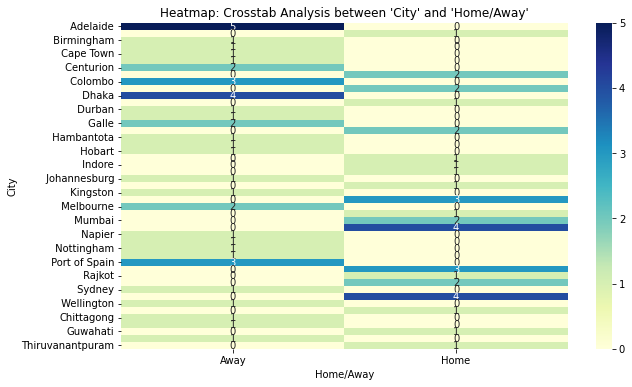

Crosstab Analysis between 'City' and 'Match Date':

Match Date        01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
City                                                                           
 Adelaide                  0           0           0           0           0   
 Bangalore                 0           0           0           0           0   
 Birmingham                0           1           0           0           0   
 Canberra                  0           0           0           0           0   
 Cape Town                 0           0           0           0           0   
 Cardiff                   0           0           0           0           0   
 Centurion                 0           0           0           0           0   
 Chennai                   0           0           0           0           0   
 Colombo                   0           0           0           0           1   
 Delhi                     0           0           0           1    

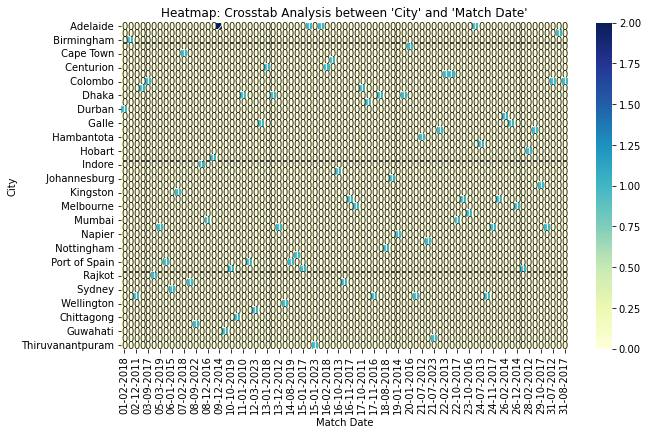

Crosstab Analysis between 'City' and 'Match Result':

Match Result      Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
City                                                           
 Adelaide             0     3           0     0    2          0
 Bangalore            0     0           0     0    1          0
 Birmingham           0     1           0     0    0          0
 Canberra             0     1           0     0    0          0
 Cape Town            0     0           0     0    1          0
 Cardiff              0     0           1     0    0          0
 Centurion            0     1           0     0    1          0
 Chennai              0     0           0     0    2          0
 Colombo              0     0           0     0    3          0
 Delhi                1     0           0     0    1          0
 Dhaka                0     0           0     0    4          0
 Dharamshala          0     0           0     0    1          0
 Durban               0     0           0     0   

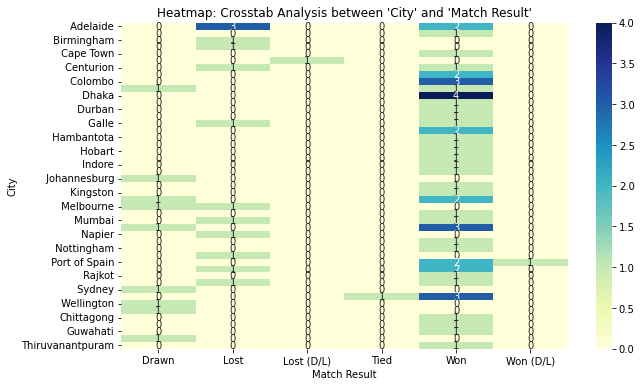

Crosstab Analysis between 'City' and 'Match Format':

Match Format      ODI  T20I  Test
City                             
 Adelaide           2     0     3
 Bangalore          0     0     1
 Birmingham         0     0     1
 Canberra           1     0     0
 Cape Town          1     0     0
 Cardiff            1     0     0
 Centurion          1     0     1
 Chennai            1     0     1
 Colombo            3     0     0
 Delhi              1     0     1
 Dhaka              4     0     0
 Dharamshala        1     0     0
 Durban             1     0     0
 Fatullah           1     0     0
 Galle              0     0     2
 Guwahati           2     0     0
 Hambantota         1     0     0
 Harare             1     0     0
 Hobart             1     0     0
 Hyderabad          0     0     1
 Indore             0     0     1
 Jaipur             1     0     0
 Johannesburg       0     0     1
 Kanpur             1     0     0
 Kingston           1     0     0
 Kolkata            1     0 

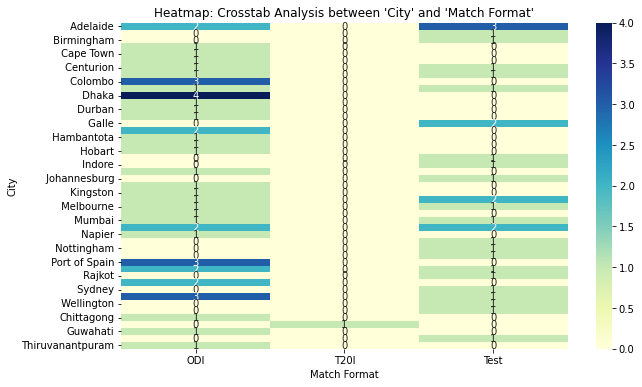

Crosstab Analysis between 'City' and 'Player of the Match':

Player of the Match  No  Yes
City                        
 Adelaide             3    2
 Bangalore            0    1
 Birmingham           1    0
 Canberra             1    0
 Cape Town            0    1
 Cardiff              1    0
 Centurion            1    1
 Chennai              1    1
 Colombo              1    2
 Delhi                0    2
 Dhaka                1    3
 Dharamshala          0    1
 Durban               0    1
 Fatullah             0    1
 Galle                2    0
 Guwahati             0    2
 Hambantota           0    1
 Harare               0    1
 Hobart               0    1
 Hyderabad            0    1
 Indore               1    0
 Jaipur               1    0
 Johannesburg         1    0
 Kanpur               1    0
 Kingston             0    1
 Kolkata              3    0
 Melbourne            2    0
 Mohali               0    1
 Mumbai               1    1
 Nagpur               1    3
 Napier    

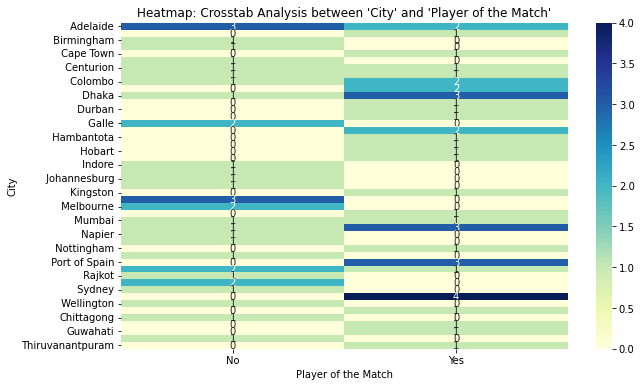

Crosstab Analysis between 'City' and 'Team Captain':

Team Captain      No  Yes
City                     
 Adelaide          2    3
 Bangalore         1    0
 Birmingham        0    1
 Canberra          1    0
 Cape Town         0    1
 Cardiff           1    0
 Centurion         0    2
 Chennai           2    0
 Colombo           1    2
 Delhi             1    1
 Dhaka             4    0
 Dharamshala       1    0
 Durban            0    1
 Fatullah          0    1
 Galle             0    2
 Guwahati          1    1
 Hambantota        1    0
 Harare            0    1
 Hobart            1    0
 Hyderabad         0    1
 Indore            0    1
 Jaipur            1    0
 Johannesburg      1    0
 Kanpur            0    1
 Kingston          0    1
 Kolkata           1    2
 Melbourne         2    0
 Mohali            1    0
 Mumbai            0    2
 Nagpur            2    2
 Napier            1    0
 North Sound       0    1
 Nottingham        0    1
 Perth             0    1
 Port of S

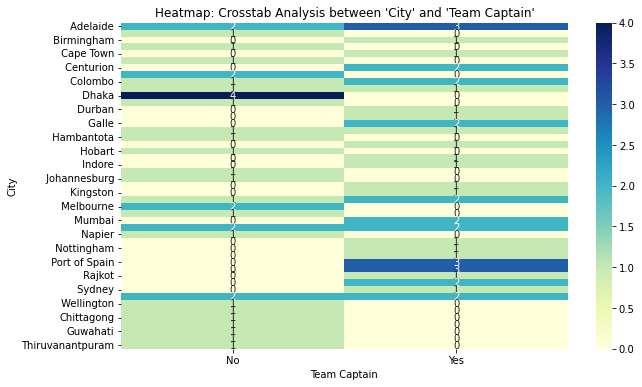

Crosstab Analysis between 'Home/Away' and 'Batting Status':

Batting Status  Not Out  Out
Home/Away                   
Away                 12   29
Home                  9   26




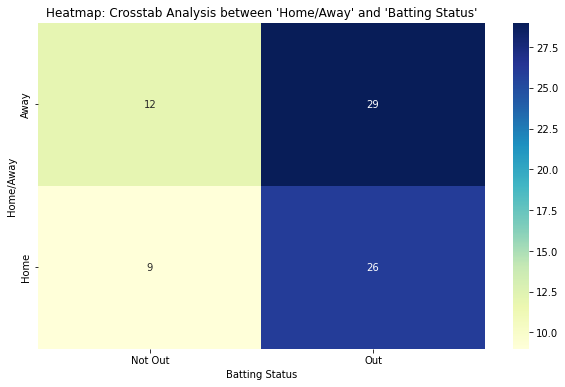

Crosstab Analysis between 'Home/Away' and 'Opponent Team':

Opponent Team  Afganistan  Australia  Bangladesh  England  New Zealand  \
Home/Away                                                                
Away                    1          9           4        3            2   
Home                    0          7           2        5            6   

Opponent Team  Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Home/Away                                                                
Away                  2             5          8            6         1  
Home                  0             2          7            6         0  




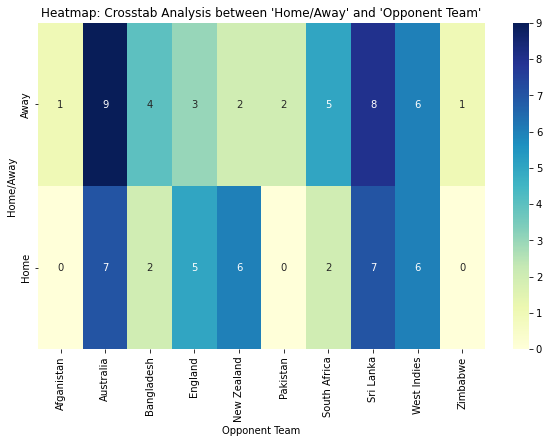

Crosstab Analysis between 'Home/Away' and 'Match Venue':

Match Venue  ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Home/Away                                                               
Away                   0                         0                  0   
Home                   1                         2                  2   

Match Venue  Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Home/Away                                                              
Away                     5          0              1               1   
Home                     0          1              0               0   

Match Venue  Dubai International Cricket Stadium  Eden Gardens  \
Home/Away                                                        
Away                                           1             0   
Home                                           0             3   

Match Venue  Edgbaston Cricket Ground  ...  Sir Vivian Richards Stadium  \
Home/Away           

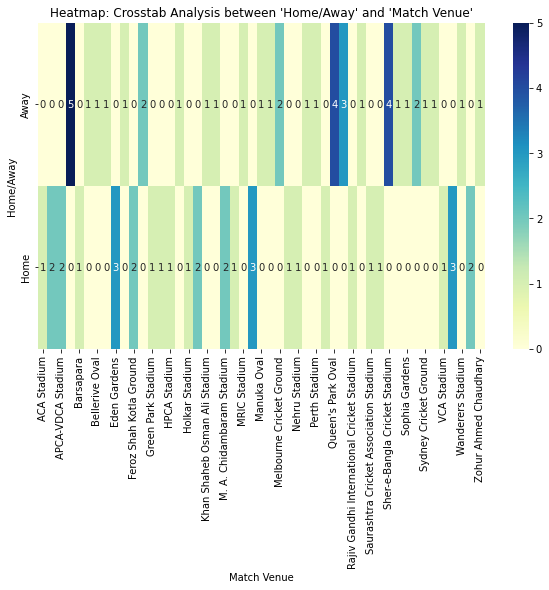

Crosstab Analysis between 'Home/Away' and 'City':

City        Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Home/Away                                                              
Away               5           0            1          1           1   
Home               0           1            0          0           0   

City        Cardiff   Centurion   Chennai   Colombo   Delhi  ...   Ranchi  \
Home/Away                                                    ...            
Away              1           2         0         3       0  ...        0   
Home              0           0         2         0       2  ...        2   

City        Sydney   Visakhapatnam   Wellington  Ahemdabad  Chittagong  Dubai  \
Home/Away                                                                       
Away             1               0            1          0           1      1   
Home             0               4            0          1           0      0   

City       Guwahati  Port 

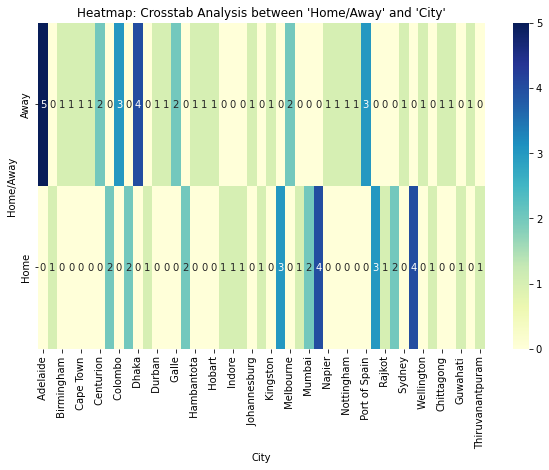

Crosstab Analysis between 'Home/Away' and 'Match Date':

Match Date  01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Home/Away                                                                
Away                 1           1           0           0           1   
Home                 0           0           1           1           0   

Match Date  04-10-2018  05-03-2019  05-07-2013  06-01-2015  06-07-2017  ...  \
Home/Away                                                               ...   
Away                 0           0           1           1           1  ...   
Home                 1           1           0           0           0  ...   

Match Date  26-07-2017  26-12-2014  27-10-2018  28-02-2012  28-11-2010  \
Home/Away                                                                
Away                 1           1           0           1           0   
Home                 0           0           1           0           1   

Match Date  29-10-2017  30-10-20

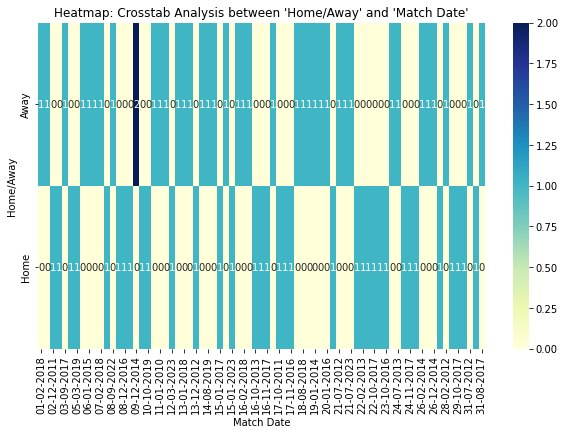

Crosstab Analysis between 'Home/Away' and 'Match Result':

Match Result  Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Home/Away                                                  
Away              5    10           1     0   24          1
Home              4     3           0     1   27          0




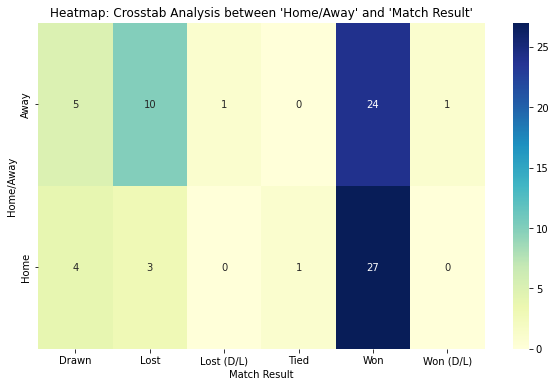

Crosstab Analysis between 'Home/Away' and 'Match Format':

Match Format  ODI  T20I  Test
Home/Away                    
Away           25     1    15
Home           21     0    14




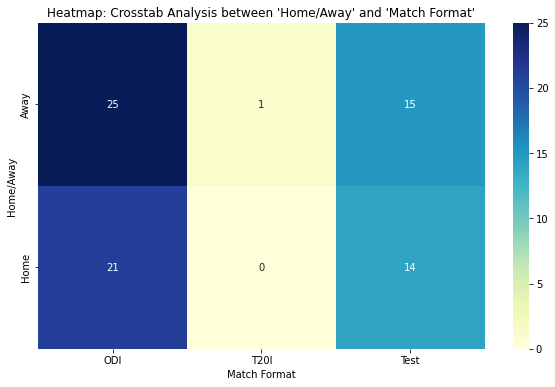

Crosstab Analysis between 'Home/Away' and 'Player of the Match':

Player of the Match  No  Yes
Home/Away                   
Away                 21   20
Home                 14   21




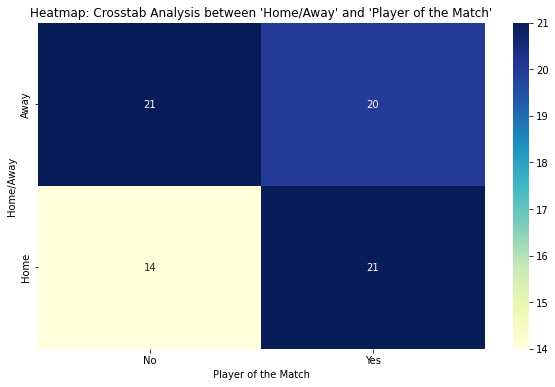

Crosstab Analysis between 'Home/Away' and 'Team Captain':

Team Captain  No  Yes
Home/Away            
Away          19   22
Home          16   19




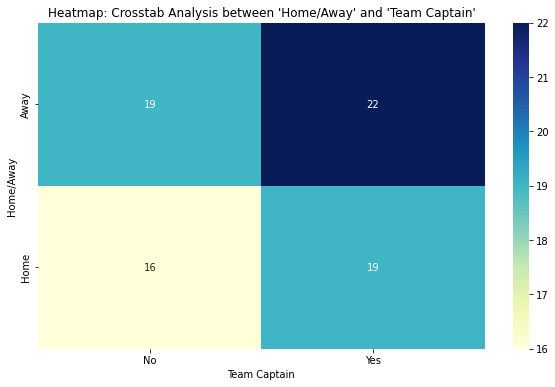

Crosstab Analysis between 'Match Date' and 'Batting Status':

Batting Status  Not Out  Out
Match Date                  
01-02-2018            0    1
01-08-2018            0    1
02-12-2011            0    1
02-12-2017            0    1
03-09-2017            1    0
...                 ...  ...
29-10-2017            0    1
30-10-2013            1    0
31-07-2012            1    0
31-08-2012            0    1
31-08-2017            0    1

[75 rows x 2 columns]




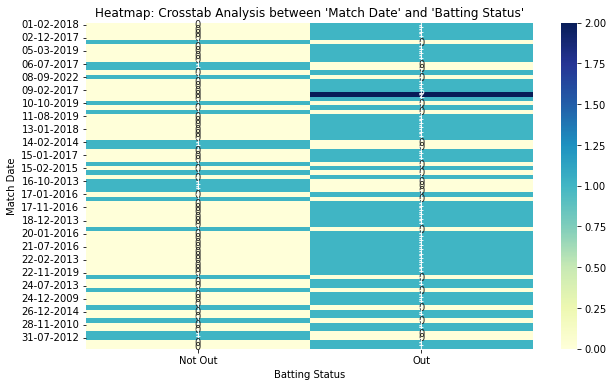

Crosstab Analysis between 'Match Date' and 'Opponent Team':

Opponent Team  Afganistan  Australia  Bangladesh  England  New Zealand  \
Match Date                                                               
01-02-2018              0          0           0        0            0   
01-08-2018              0          0           0        1            0   
02-12-2011              0          0           0        0            0   
02-12-2017              0          0           0        0            0   
03-09-2017              0          0           0        0            0   
...                   ...        ...         ...      ...          ...   
29-10-2017              0          0           0        0            1   
30-10-2013              0          1           0        0            0   
31-07-2012              0          0           0        0            0   
31-08-2012              0          0           0        0            1   
31-08-2017              0          0           0   

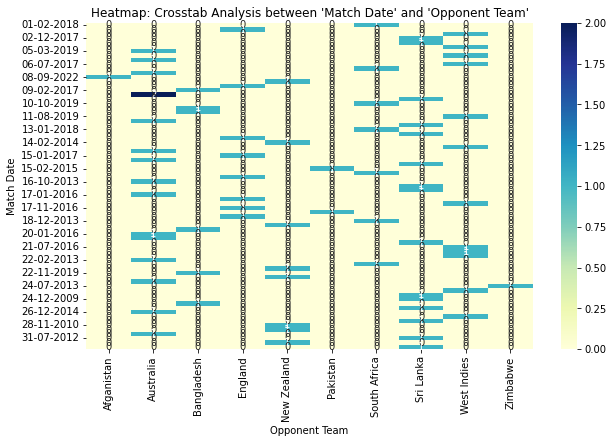

Crosstab Analysis between 'Match Date' and 'Match Venue':

Match Venue  ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Match Date                                                              
01-02-2018             0                         0                  0   
01-08-2018             0                         0                  0   
02-12-2011             0                         0                  1   
02-12-2017             0                         0                  0   
03-09-2017             0                         0                  0   
...                  ...                       ...                ...   
29-10-2017             0                         0                  0   
30-10-2013             0                         0                  0   
31-07-2012             0                         0                  0   
31-08-2012             0                         0                  0   
31-08-2017             0                         0               

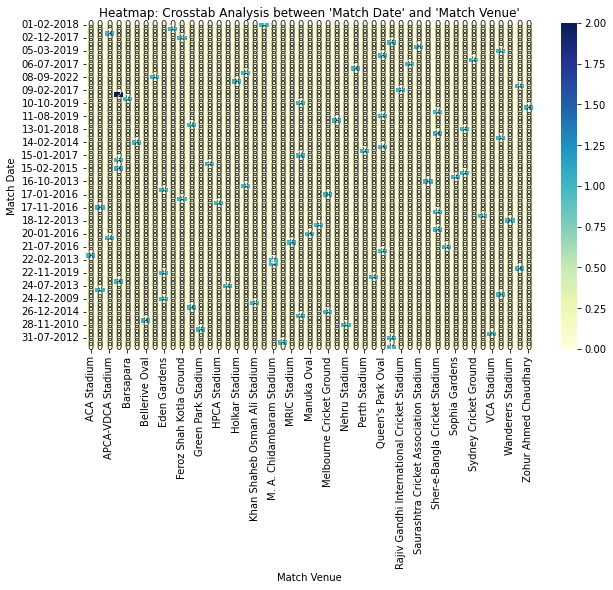

Crosstab Analysis between 'Match Date' and 'City':

City         Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Match Date                                                              
01-02-2018          0           0            0          0           0   
01-08-2018          0           0            1          0           0   
02-12-2011          0           0            0          0           0   
02-12-2017          0           0            0          0           0   
03-09-2017          0           0            0          0           0   
...               ...         ...          ...        ...         ...   
29-10-2017          0           0            0          0           0   
30-10-2013          0           0            0          0           0   
31-07-2012          0           0            0          0           0   
31-08-2012          0           1            0          0           0   
31-08-2017          0           0            0          0           0   

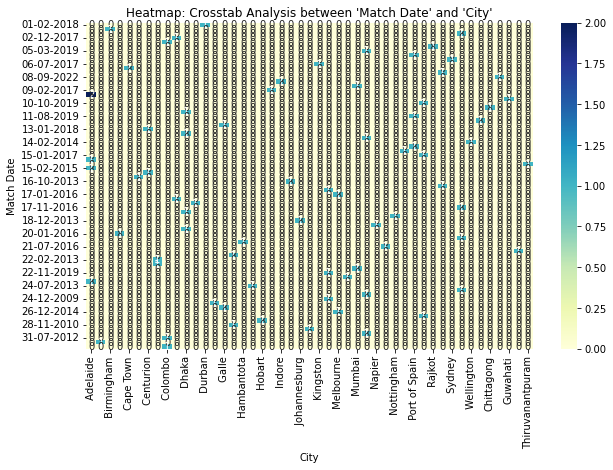

Crosstab Analysis between 'Match Date' and 'Home/Away':

Home/Away   Away  Home
Match Date            
01-02-2018     1     0
01-08-2018     1     0
02-12-2011     0     1
02-12-2017     0     1
03-09-2017     1     0
...          ...   ...
29-10-2017     0     1
30-10-2013     0     1
31-07-2012     1     0
31-08-2012     0     1
31-08-2017     1     0

[75 rows x 2 columns]




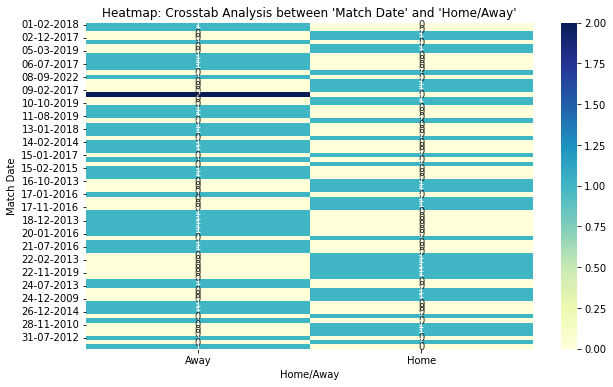

Crosstab Analysis between 'Match Date' and 'Match Result':

Match Result  Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Match Date                                                 
01-02-2018        0     0           0     0    1          0
01-08-2018        0     1           0     0    0          0
02-12-2011        0     0           0     0    1          0
02-12-2017        1     0           0     0    0          0
03-09-2017        0     0           0     0    1          0
...             ...   ...         ...   ...  ...        ...
29-10-2017        0     0           0     0    1          0
30-10-2013        0     0           0     0    1          0
31-07-2012        0     0           0     0    1          0
31-08-2012        0     0           0     0    1          0
31-08-2017        0     0           0     0    1          0

[75 rows x 6 columns]




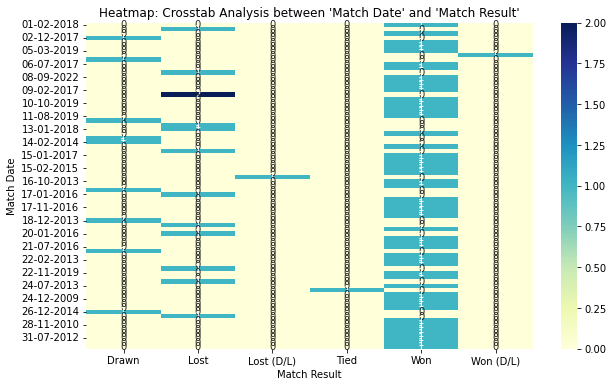

Crosstab Analysis between 'Match Date' and 'Match Format':

Match Format  ODI  T20I  Test
Match Date                   
01-02-2018      1     0     0
01-08-2018      0     0     1
02-12-2011      1     0     0
02-12-2017      0     0     1
03-09-2017      1     0     0
...           ...   ...   ...
29-10-2017      1     0     0
30-10-2013      1     0     0
31-07-2012      1     0     0
31-08-2012      0     0     1
31-08-2017      1     0     0

[75 rows x 3 columns]




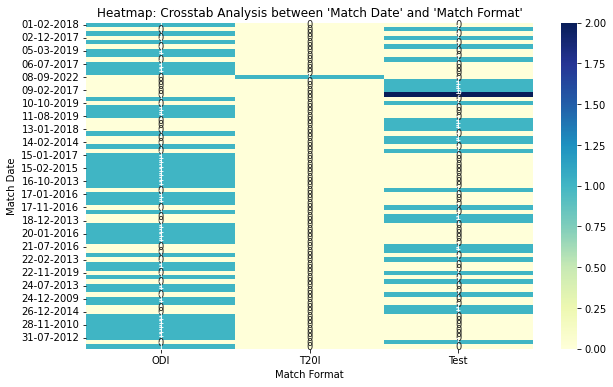

Crosstab Analysis between 'Match Date' and 'Player of the Match':

Player of the Match  No  Yes
Match Date                  
01-02-2018            0    1
01-08-2018            1    0
02-12-2011            0    1
02-12-2017            0    1
03-09-2017            1    0
...                  ..  ...
29-10-2017            1    0
30-10-2013            0    1
31-07-2012            0    1
31-08-2012            0    1
31-08-2017            0    1

[75 rows x 2 columns]




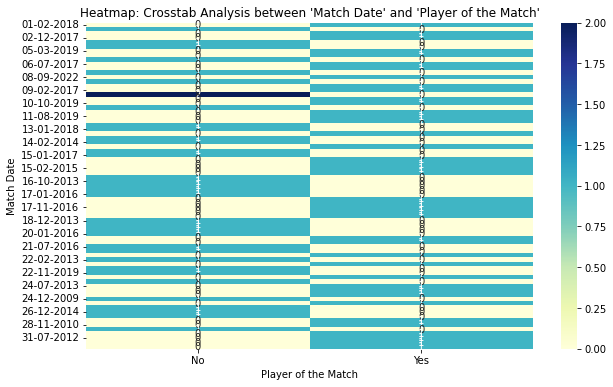

Crosstab Analysis between 'Match Date' and 'Team Captain':

Team Captain  No  Yes
Match Date           
01-02-2018     0    1
01-08-2018     0    1
02-12-2011     1    0
02-12-2017     0    1
03-09-2017     0    1
...           ..  ...
29-10-2017     0    1
30-10-2013     1    0
31-07-2012     1    0
31-08-2012     1    0
31-08-2017     0    1

[75 rows x 2 columns]




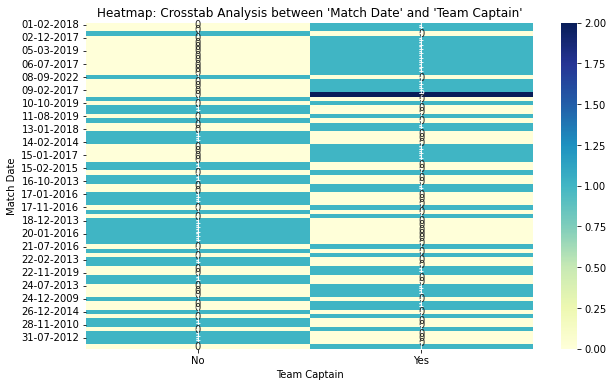

Crosstab Analysis between 'Match Result' and 'Batting Status':

Batting Status  Not Out  Out
Match Result                
Drawn                 2    7
Lost                  0   13
Lost (D/L)            0    1
Tied                  1    0
Won                  18   33
Won (D/L)             0    1




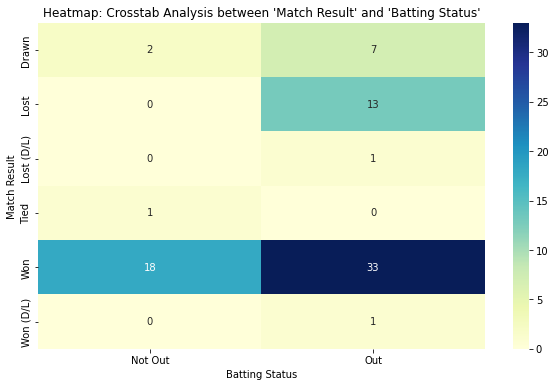

Crosstab Analysis between 'Match Result' and 'Opponent Team':

Opponent Team  Afganistan  Australia  Bangladesh  England  New Zealand  \
Match Result                                                             
Drawn                   0          3           0        1            1   
Lost                    0          7           0        1            2   
Lost (D/L)              0          0           0        1            0   
Tied                    0          0           0        0            0   
Won                     1          6           6        5            5   
Won (D/L)               0          0           0        0            0   

Opponent Team  Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Match Result                                                             
Drawn                 0             1          2            1         0  
Lost                  0             1          1            1         0  
Lost (D/L)            0             0          0

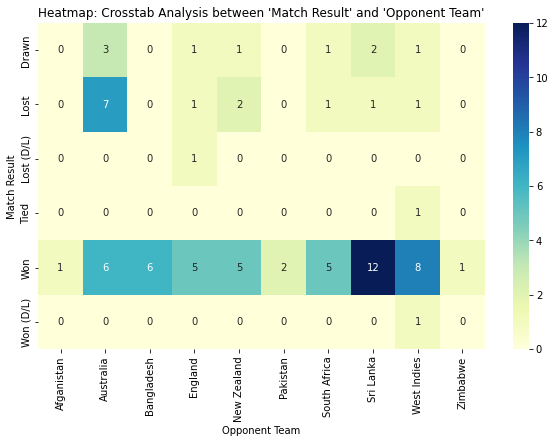

Crosstab Analysis between 'Match Result' and 'Match Venue':

Match Venue   ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Match Result                                                             
Drawn                   0                         0                  0   
Lost                    0                         0                  0   
Lost (D/L)              0                         0                  0   
Tied                    0                         1                  0   
Won                     1                         1                  2   
Won (D/L)               0                         0                  0   

Match Venue   Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Match Result                                                            
Drawn                     0          0              1               0   
Lost                      3          0              0               0   
Lost (D/L)                0          0              0 

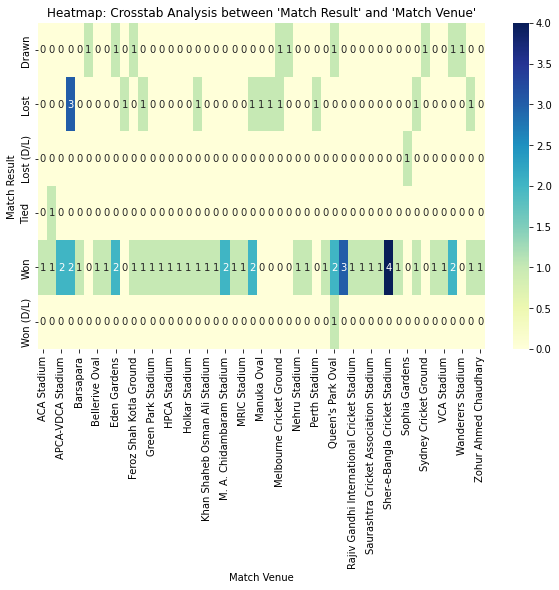

Crosstab Analysis between 'Match Result' and 'City':

City           Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Match Result                                                              
Drawn                 0           0            0          0           0   
Lost                  3           0            1          1           0   
Lost (D/L)            0           0            0          0           0   
Tied                  0           0            0          0           0   
Won                   2           1            0          0           1   
Won (D/L)             0           0            0          0           0   

City           Cardiff   Centurion   Chennai   Colombo   Delhi  ...   Ranchi  \
Match Result                                                    ...            
Drawn                0           0         0         0       1  ...        0   
Lost                 0           1         0         0       0  ...        1   
Lost (D/L)           1   

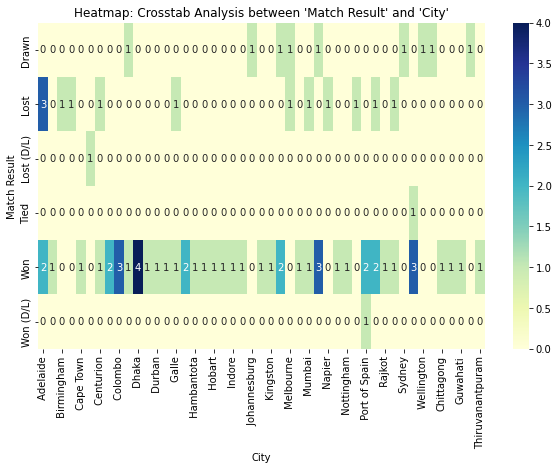

Crosstab Analysis between 'Match Result' and 'Home/Away':

Home/Away     Away  Home
Match Result            
Drawn            5     4
Lost            10     3
Lost (D/L)       1     0
Tied             0     1
Won             24    27
Won (D/L)        1     0




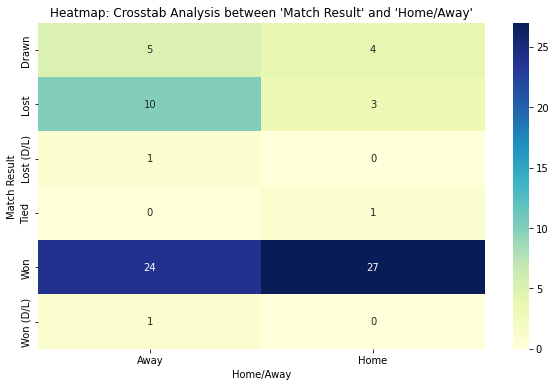

Crosstab Analysis between 'Match Result' and 'Match Date':

Match Date    01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Match Result                                                               
Drawn                  0           0           0           1           0   
Lost                   0           1           0           0           0   
Lost (D/L)             0           0           0           0           0   
Tied                   0           0           0           0           0   
Won                    1           0           1           0           1   
Won (D/L)              0           0           0           0           0   

Match Date    04-10-2018  05-03-2019  05-07-2013  06-01-2015  06-07-2017  ...  \
Match Result                                                              ...   
Drawn                  0           0           0           1           0  ...   
Lost                   0           0           0           0           0  ...   
Lost (D

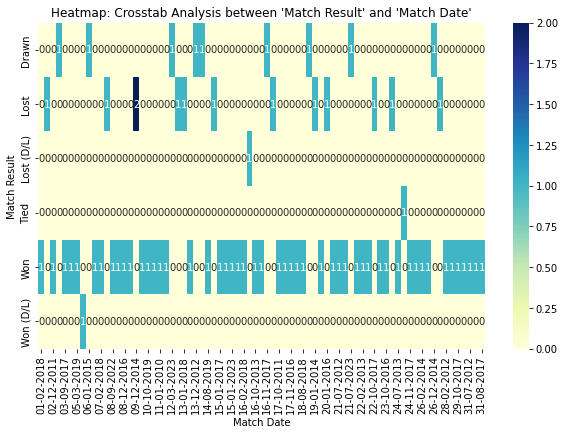

Crosstab Analysis between 'Match Result' and 'Match Format':

Match Format  ODI  T20I  Test
Match Result                 
Drawn           0     0     9
Lost            6     0     7
Lost (D/L)      1     0     0
Tied            1     0     0
Won            37     1    13
Won (D/L)       1     0     0




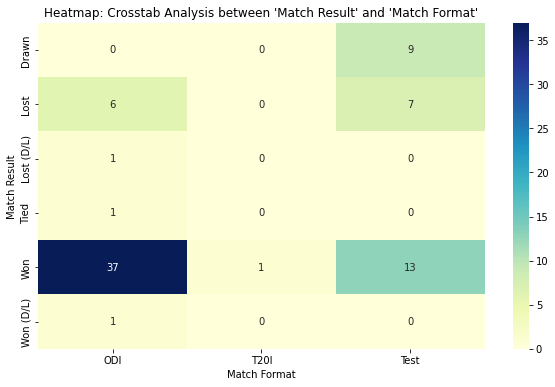

Crosstab Analysis between 'Match Result' and 'Player of the Match':

Player of the Match  No  Yes
Match Result                
Drawn                 7    2
Lost                 13    0
Lost (D/L)            1    0
Tied                  0    1
Won                  14   37
Won (D/L)             0    1




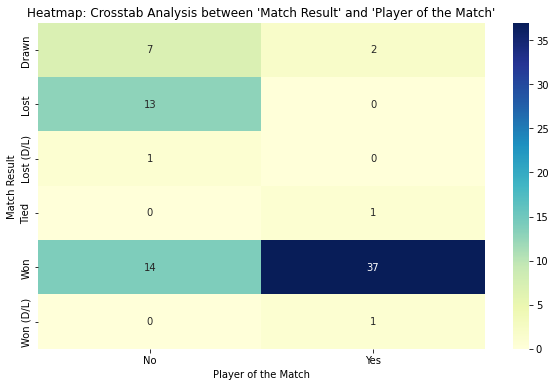

Crosstab Analysis between 'Match Result' and 'Team Captain':

Team Captain  No  Yes
Match Result         
Drawn          6    3
Lost           4    9
Lost (D/L)     1    0
Tied           0    1
Won           24   27
Won (D/L)      0    1




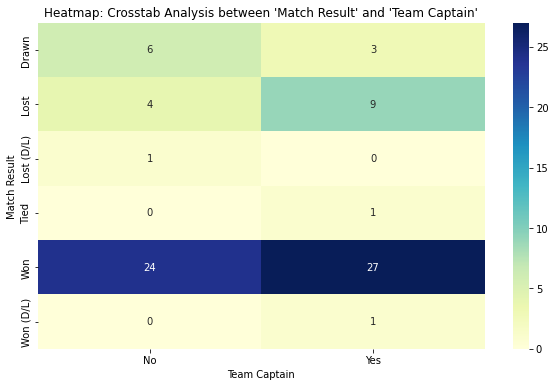

Crosstab Analysis between 'Match Format' and 'Batting Status':

Batting Status  Not Out  Out
Match Format                
ODI                  16   30
T20I                  1    0
Test                  4   25




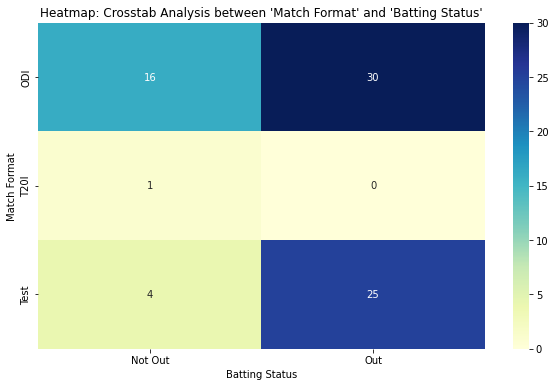

Crosstab Analysis between 'Match Format' and 'Opponent Team':

Opponent Team  Afganistan  Australia  Bangladesh  England  New Zealand  \
Match Format                                                             
ODI                     0          8           4        3            5   
T20I                    1          0           0        0            0   
Test                    0          8           2        5            3   

Opponent Team  Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Match Format                                                             
ODI                   2             4         10            9         1  
T20I                  0             0          0            0         0  
Test                  0             3          5            3         0  




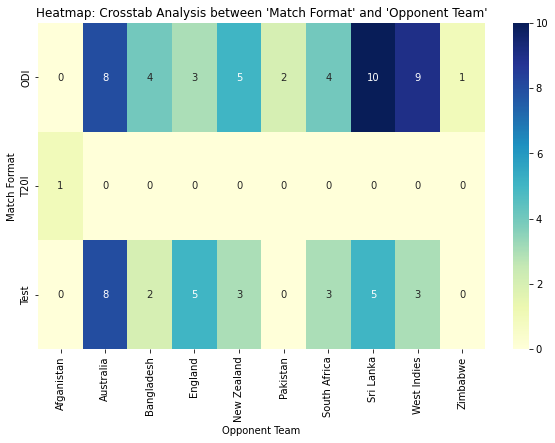

Crosstab Analysis between 'Match Format' and 'Match Venue':

Match Venue   ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Match Format                                                             
ODI                     1                         1                  2   
T20I                    0                         0                  0   
Test                    0                         1                  0   

Match Venue   Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Match Format                                                            
ODI                       2          1              0               1   
T20I                      0          0              0               0   
Test                      3          0              1               0   

Match Venue   Dubai International Cricket Stadium  Eden Gardens  \
Match Format                                                      
ODI                                             0             1   
T

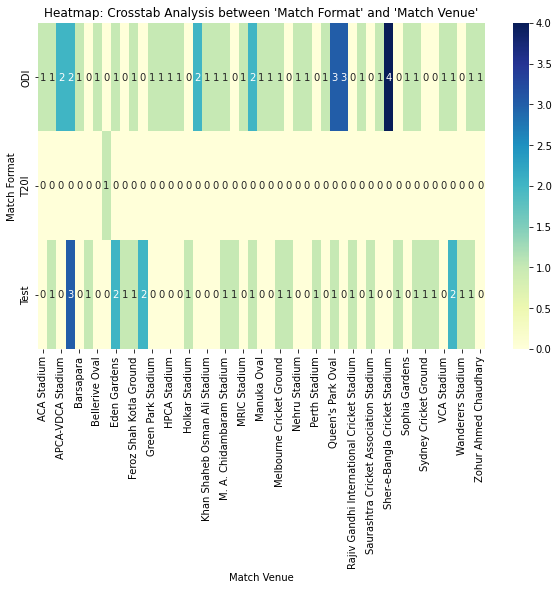

Crosstab Analysis between 'Match Format' and 'City':

City           Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Match Format                                                              
ODI                   2           0            0          1           1   
T20I                  0           0            0          0           0   
Test                  3           1            1          0           0   

City           Cardiff   Centurion   Chennai   Colombo   Delhi  ...   Ranchi  \
Match Format                                                    ...            
ODI                  1           1         1         3       1  ...        2   
T20I                 0           0         0         0       0  ...        0   
Test                 0           1         1         0       1  ...        0   

City           Sydney   Visakhapatnam   Wellington  Ahemdabad  Chittagong  \
Match Format                                                                
ODI            

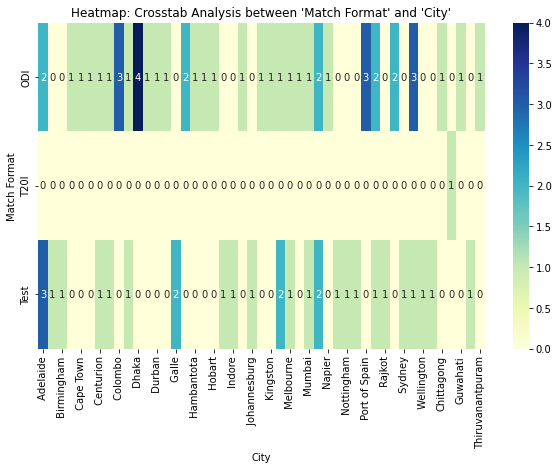

Crosstab Analysis between 'Match Format' and 'Home/Away':

Home/Away     Away  Home
Match Format            
ODI             25    21
T20I             1     0
Test            15    14




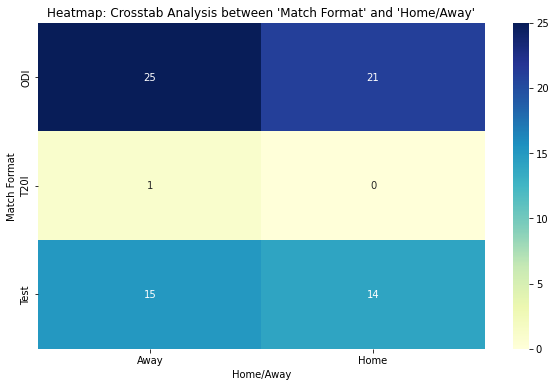

Crosstab Analysis between 'Match Format' and 'Match Date':

Match Date    01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Match Format                                                               
ODI                    1           0           1           0           1   
T20I                   0           0           0           0           0   
Test                   0           1           0           1           0   

Match Date    04-10-2018  05-03-2019  05-07-2013  06-01-2015  06-07-2017  ...  \
Match Format                                                              ...   
ODI                    0           1           1           0           1  ...   
T20I                   0           0           0           0           0  ...   
Test                   1           0           0           1           0  ...   

Match Date    26-07-2017  26-12-2014  27-10-2018  28-02-2012  28-11-2010  \
Match Format                                                               
O

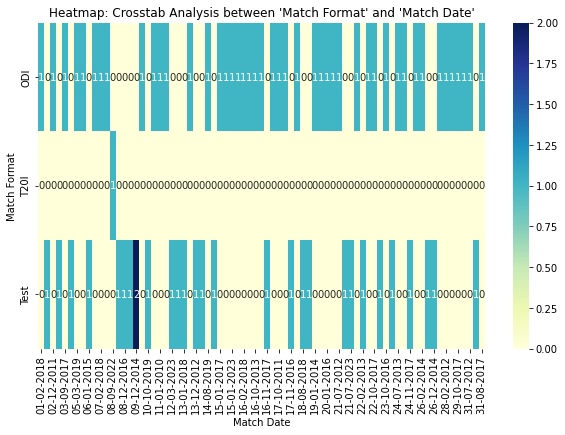

Crosstab Analysis between 'Match Format' and 'Match Result':

Match Result  Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Match Format                                               
ODI               0     6           1     1   37          1
T20I              0     0           0     0    1          0
Test              9     7           0     0   13          0




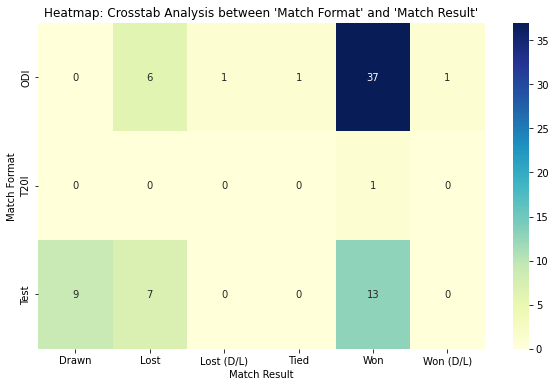

Crosstab Analysis between 'Match Format' and 'Player of the Match':

Player of the Match  No  Yes
Match Format                
ODI                  15   31
T20I                  0    1
Test                 20    9




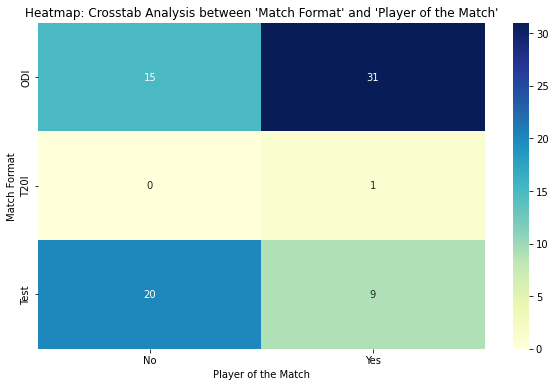

Crosstab Analysis between 'Match Format' and 'Team Captain':

Team Captain  No  Yes
Match Format         
ODI           25   21
T20I           1    0
Test           9   20




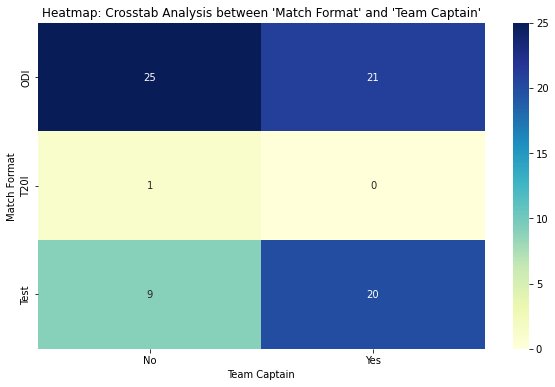

Crosstab Analysis between 'Player of the Match' and 'Batting Status':

Batting Status       Not Out  Out
Player of the Match              
No                         7   28
Yes                       14   27




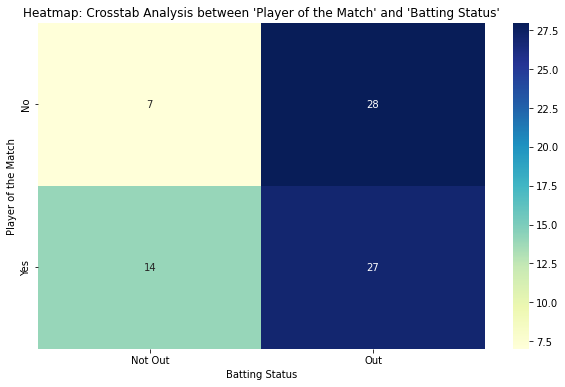

Crosstab Analysis between 'Player of the Match' and 'Opponent Team':

Opponent Team        Afganistan  Australia  Bangladesh  England  New Zealand  \
Player of the Match                                                            
No                            0         11           3        4            5   
Yes                           1          5           3        4            3   

Opponent Team        Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Player of the Match                                                            
No                          0             2          6            4         0  
Yes                         2             5          9            8         1  




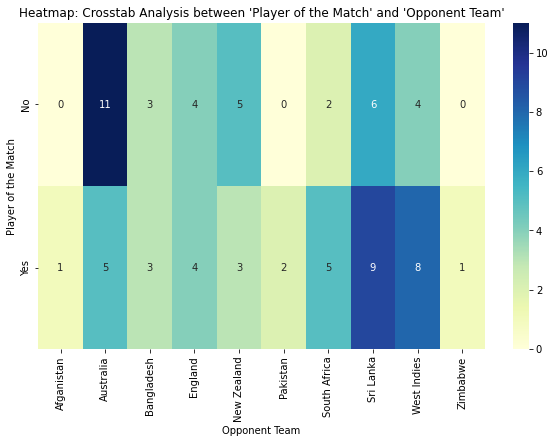

Crosstab Analysis between 'Player of the Match' and 'Match Venue':

Match Venue          ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Player of the Match                                                             
No                             0                         0                  0   
Yes                            1                         2                  2   

Match Venue          Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Player of the Match                                                            
No                               3          0              1               0   
Yes                              2          1              0               1   

Match Venue          Dubai International Cricket Stadium  Eden Gardens  \
Player of the Match                                                      
No                                                     0             3   
Yes                                                    1        

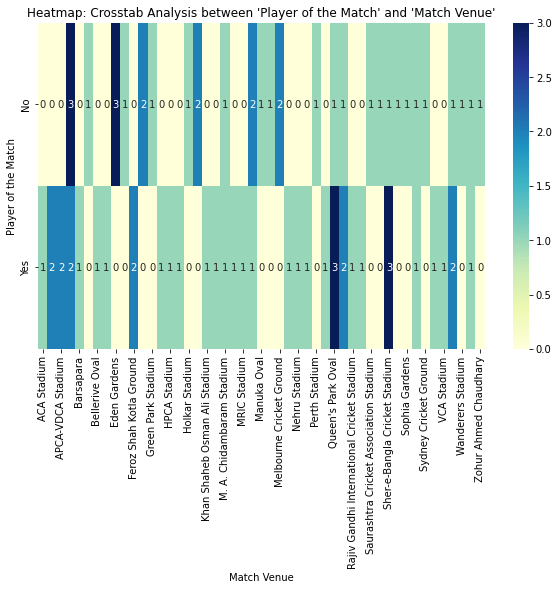

Crosstab Analysis between 'Player of the Match' and 'City':

City                  Adelaide   Bangalore   Birmingham   Canberra  \
Player of the Match                                                  
No                           3           0            1          1   
Yes                          2           1            0          0   

City                  Cape Town   Cardiff   Centurion   Chennai   Colombo  \
Player of the Match                                                         
No                            0         1           1         1         1   
Yes                           1         0           1         1         2   

City                  Delhi  ...   Ranchi   Sydney   Visakhapatnam  \
Player of the Match          ...                                     
No                        0  ...        2        1               0   
Yes                       2  ...        0        0               4   

City                  Wellington  Ahemdabad  Chittagong  Dubai  Guwa

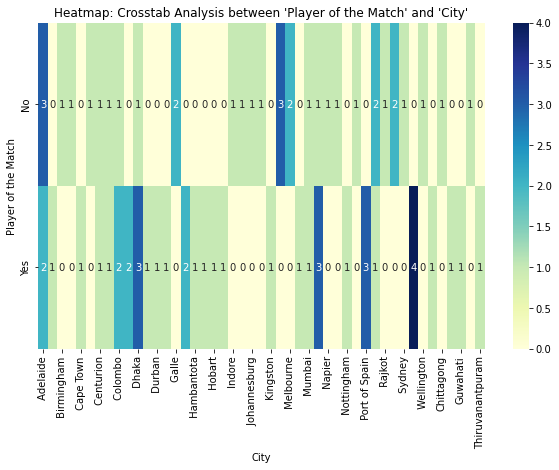

Crosstab Analysis between 'Player of the Match' and 'Home/Away':

Home/Away            Away  Home
Player of the Match            
No                     21    14
Yes                    20    21




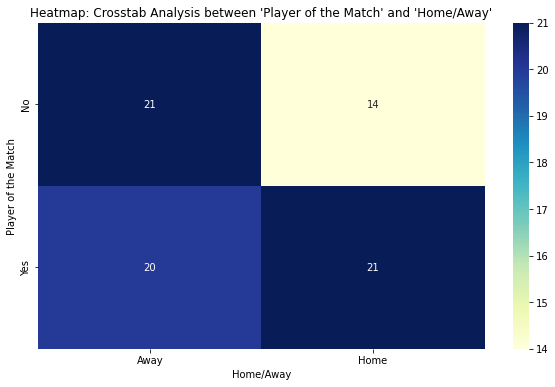

Crosstab Analysis between 'Player of the Match' and 'Match Date':

Match Date           01-02-2018  01-08-2018  02-12-2011  02-12-2017  \
Player of the Match                                                   
No                            0           1           0           0   
Yes                           1           0           1           1   

Match Date           03-09-2017  04-10-2018  05-03-2019  05-07-2013  \
Player of the Match                                                   
No                            1           1           0           0   
Yes                           0           0           1           1   

Match Date           06-01-2015  06-07-2017  ...  26-07-2017  26-12-2014  \
Player of the Match                          ...                           
No                            1           0  ...           1           1   
Yes                           0           1  ...           0           0   

Match Date           27-10-2018  28-02-2012  28-11-2010  2

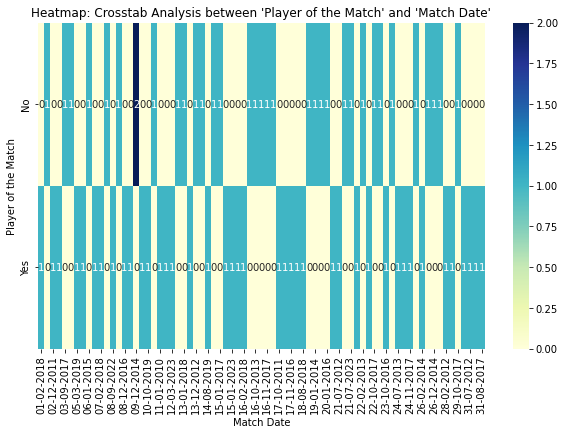

Crosstab Analysis between 'Player of the Match' and 'Match Result':

Match Result         Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Player of the Match                                               
No                       7    13           1     0   14          0
Yes                      2     0           0     1   37          1




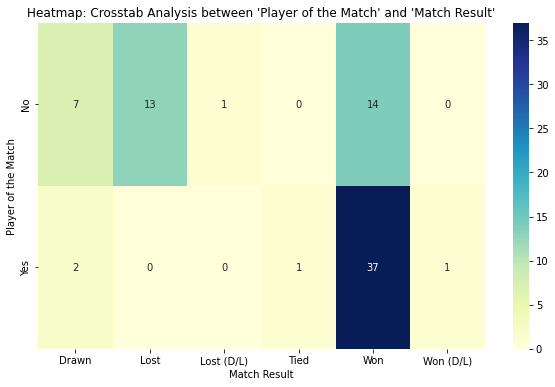

Crosstab Analysis between 'Player of the Match' and 'Match Format':

Match Format         ODI  T20I  Test
Player of the Match                 
No                    15     0    20
Yes                   31     1     9




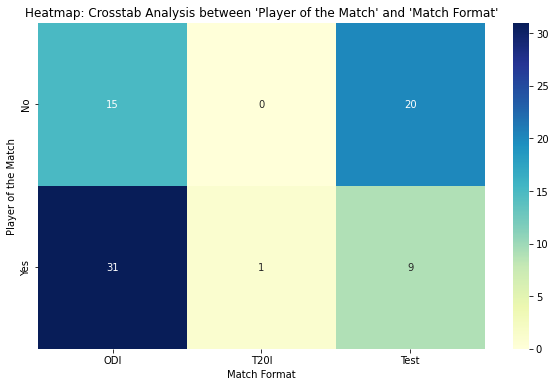

Crosstab Analysis between 'Player of the Match' and 'Team Captain':

Team Captain         No  Yes
Player of the Match         
No                   15   20
Yes                  20   21




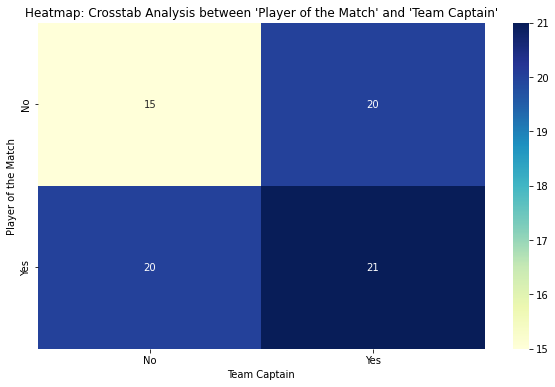

Crosstab Analysis between 'Team Captain' and 'Batting Status':

Batting Status  Not Out  Out
Team Captain                
No                   11   24
Yes                  10   31




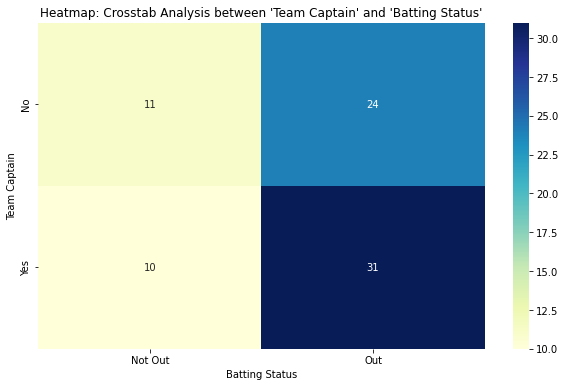

Crosstab Analysis between 'Team Captain' and 'Opponent Team':

Opponent Team  Afganistan  Australia  Bangladesh  England  New Zealand  \
Team Captain                                                             
No                      1          9           3        3            5   
Yes                     0          7           3        5            3   

Opponent Team  Pakistan  South Africa  Sri Lanka  West Indies  Zimbabwe  
Team Captain                                                             
No                    2             2          7            3         0  
Yes                   0             5          8            9         1  




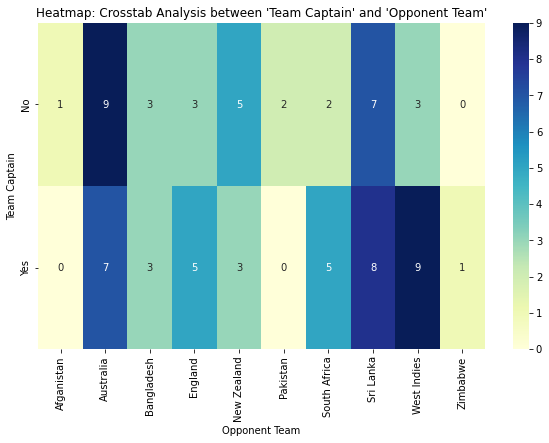

Crosstab Analysis between 'Team Captain' and 'Match Venue':

Match Venue   ACA Stadium  ACA-VDCA Cricket Stadium  APCA-VDCA Stadium  \
Team Captain                                                             
No                      0                         0                  2   
Yes                     1                         2                  0   

Match Venue   Adelaide Oval  Barsapara  Basin Reserve  Bellerive Oval  \
Team Captain                                                            
No                        2          1              1               1   
Yes                       3          0              0               0   

Match Venue   Dubai International Cricket Stadium  Eden Gardens  \
Team Captain                                                      
No                                              1             1   
Yes                                             0             2   

Match Venue   Edgbaston Cricket Ground  ...  Sir Vivian Richards Stadium  \
Team

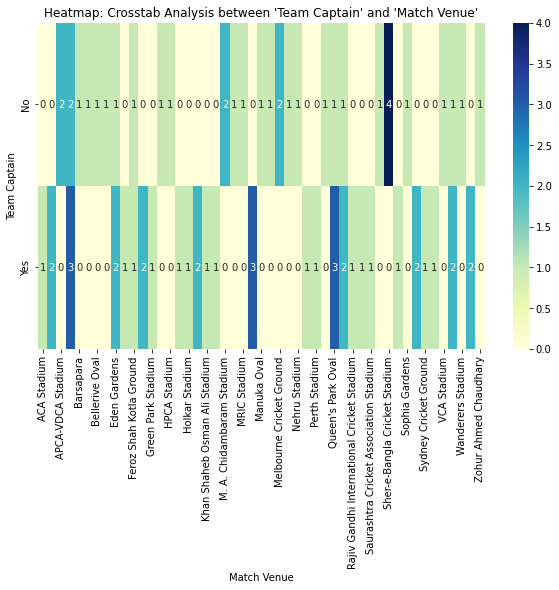

Crosstab Analysis between 'Team Captain' and 'City':

City           Adelaide   Bangalore   Birmingham   Canberra   Cape Town  \
Team Captain                                                              
No                    2           1            0          1           0   
Yes                   3           0            1          0           1   

City           Cardiff   Centurion   Chennai   Colombo   Delhi  ...   Ranchi  \
Team Captain                                                    ...            
No                   1           0         2         1       1  ...        0   
Yes                  0           2         0         2       1  ...        2   

City           Sydney   Visakhapatnam   Wellington  Ahemdabad  Chittagong  \
Team Captain                                                                
No                  0               2            1          1           1   
Yes                 1               2            0          0           0   

City          D

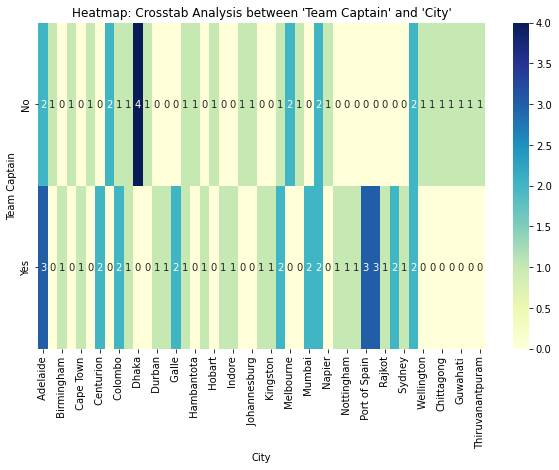

Crosstab Analysis between 'Team Captain' and 'Home/Away':

Home/Away     Away  Home
Team Captain            
No              19    16
Yes             22    19




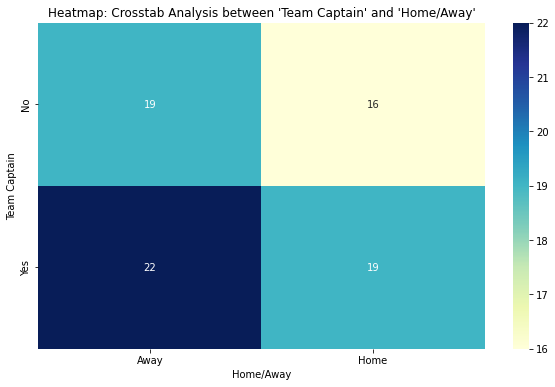

Crosstab Analysis between 'Team Captain' and 'Match Date':

Match Date    01-02-2018  01-08-2018  02-12-2011  02-12-2017  03-09-2017  \
Team Captain                                                               
No                     0           0           1           0           0   
Yes                    1           1           0           1           1   

Match Date    04-10-2018  05-03-2019  05-07-2013  06-01-2015  06-07-2017  ...  \
Team Captain                                                              ...   
No                     0           0           0           0           0  ...   
Yes                    1           1           1           1           1  ...   

Match Date    26-07-2017  26-12-2014  27-10-2018  28-02-2012  28-11-2010  \
Team Captain                                                               
No                     0           1           0           1           1   
Yes                    1           0           1           0           0   

Match

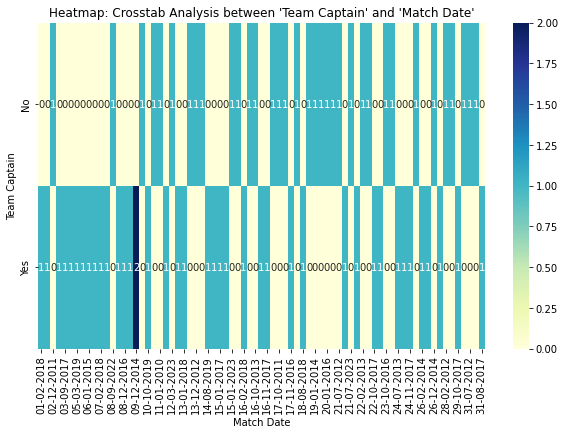

Crosstab Analysis between 'Team Captain' and 'Match Result':

Match Result  Drawn  Lost  Lost (D/L)  Tied  Won  Won (D/L)
Team Captain                                               
No                6     4           1     0   24          0
Yes               3     9           0     1   27          1




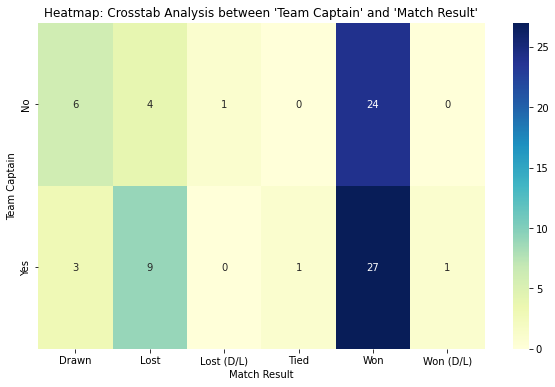

Crosstab Analysis between 'Team Captain' and 'Match Format':

Match Format  ODI  T20I  Test
Team Captain                 
No             25     1     9
Yes            21     0    20




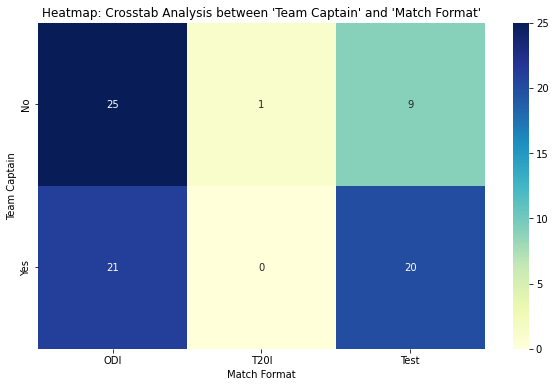

Crosstab Analysis between 'Team Captain' and 'Player of the Match':

Player of the Match  No  Yes
Team Captain                
No                   15   20
Yes                  20   21




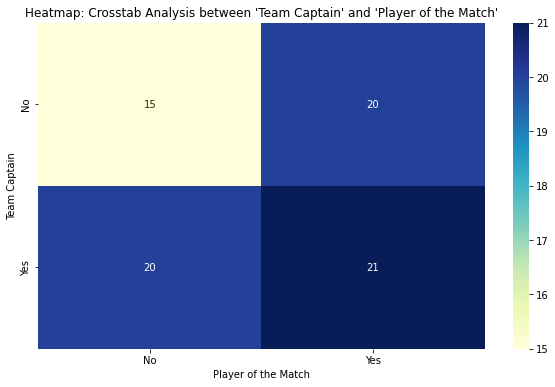

In [37]:
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            crosstab_result = pd.crosstab(df[col1], df[col2])
            print(f"Crosstab Analysis between '{col1}' and '{col2}':\n")
            print(crosstab_result)
            print("\n")

            plt.figure(figsize=(10, 6))
            sns.heatmap(crosstab_result, annot=True, cmap="YlGnBu", fmt='d')
            plt.title(f"Heatmap: Crosstab Analysis between '{col1}' and '{col2}'")
            plt.xlabel(col2)
            plt.ylabel(col1)
            plt.show()

In [38]:
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            crosstab_result = pd.crosstab(df[col1], df[col2])

            fig = px.imshow(crosstab_result,
                            x=crosstab_result.columns,
                            y=crosstab_result.index,
                            color_continuous_scale="YlGnBu",
                            title=f"Heatmap: Crosstab Analysis between '{col1}' and '{col2}'")
            fig.update_xaxes(side="top")
            fig.show()

In [39]:
df['Match Date'] = pd.to_datetime(df['Match Date'])

In [40]:
df['Year'] = df['Match Date'].dt.year
df['Month'] = df['Match Date'].dt.month_name()

In [41]:
matches_per_year = df.groupby('Year').size().reset_index(name='Matches')
matches_per_month = df.groupby(['Year', 'Month']).size().reset_index(name='Matches')

In [42]:
fig_year = px.line(matches_per_year, x='Year', y='Matches', title='Matches per Year')
fig_year.show()

In [ ]:
for year in df['Year'].unique():
    matches_year = matches_per_month[matches_per_month['Year'] == year]
    fig = px.line(matches_year, x='Month', y='Matches', title=f'Matches per Month ({year})', markers=True)
    fig.update_xaxes(type='category', categoryorder='category ascending')
    fig.show()

In [ ]:
corr_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [ ]:
inning_trends = df.groupby('Match Date')['Inning Number'].mean().reset_index()
fig_inning = px.line(inning_trends, x='Match Date', y='Inning Number', title='Trends Over Time - Inning Number')
fig_inning.show()

In [ ]:
score_trends = df.groupby('Match Date')['Batting Score'].mean().reset_index()
fig_score = px.line(score_trends, x='Match Date', y='Batting Score', title='Trends Over Time - Batting Score')
fig_score.show()

# Virat Kohli's centuries are not just numbers on a scoreboard; they embody dedication, skill, and a burning passion for the sport. Through our Virat Kohli Centuries Analysis, we've endeavored to unravel the magic behind these centuries – the countless hours of practice, the strategic acumen, and the unyielding determination that define this cricketing icon